In [1]:
# Importing libraries
import os
import warnings
warnings.filterwarnings('ignore')
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight') 

# Above is a special style template for matplotlib, highly useful for visualizing time series data
%matplotlib inline
from pylab import rcParams
from plotly import tools
import plotly.plotly as py
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.figure_factory as ff
import statsmodels.api as sm
from numpy.random import normal, seed
from scipy.stats import norm
from statsmodels.tsa.arima_model import ARMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_process import ArmaProcess
from statsmodels.tsa.arima_model import ARIMA
import math
from sklearn.metrics import mean_squared_error

from datetime import datetime, timedelta

rcParams['figure.figsize'] = 11, 9

print(os.listdir("../input"))

['the-winton-stock-market-challenge', 'g-research-crypto-forecasting', 'price-volume-data-for-all-us-stocks-etfs', 'stock-time-series-20050101-to-20171231']


In [2]:
%%bash
# https://pypi.org/project/yahoofinancials/
pip install yahoofinancials

  Running setup.py bdist_wheel for yahoofinancials: started
  Running setup.py bdist_wheel for yahoofinancials: finished with status 'done'
  Stored in directory: /root/.cache/pip/wheels/6e/ef/ef/beecdda87e0d058a7193a2e39d311cf39f55e10d982143cc06
Successfully built yahoofinancials
  Found existing installation: requests 2.18.4
    Uninstalling requests-2.18.4:
      Successfully uninstalled requests-2.18.4


tensorflow 1.9.0rc0 has requirement setuptools<=39.1.0, but you'll have setuptools 40.0.0 which is incompatible.
mxnet 1.2.0 has requirement requests<2.19.0,>=2.18.4, but you'll have requests 2.27.1 which is incompatible.
kmodes 0.9 has requirement scikit-learn<0.20.0,>=0.19.0, but you'll have scikit-learn 0.20.dev0 which is incompatible.
kmeans-smote 0.1.0 has requirement imbalanced-learn<0.4,>=0.3.1, but you'll have imbalanced-learn 0.4.0.dev0 which is incompatible.
kmeans-smote 0.1.0 has requirement scikit-learn<0.20,>=0.19.0, but you'll have scikit-learn 0.20.dev0 which is incompatible.
hep-ml 0.5.0 has requirement theano==0.8.2, but you'll have theano 1.0.2 which is incompatible.
fastai 0.7.0 has requirement torch<0.4, but you'll have torch 0.4.0 which is incompatible.
You are using pip version 10.0.1, however version 21.3.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [3]:
from yahoofinancials import YahooFinancials
from joblib import Memory

TMPDIR = '/tmp'
memory = Memory(TMPDIR, verbose=0)

In [4]:
@memory.cache
def get_ticker_data(ticker: str, param_start_date, param_end_date) -> dict:
    raw_data = YahooFinancials(ticker)
    return raw_data.get_historical_price_data(param_start_date, param_end_date, "daily").copy()

def fetch_ticker_data(ticker: str, start_date, end_date) -> pd.DataFrame:
    date_range = pd.bdate_range(start=start_date, end=end_date)
    values = pd.DataFrame({'Date': date_range})
    values['Date'] = pd.to_datetime(values['Date'])
    raw_data = get_ticker_data(ticker, start_date, end_date)
    return pd.DataFrame(raw_data[ticker]["prices"])[['date', 'open', 'high', 'low', 'adjclose', 'volume']]    

# <a id='1'>1. Introduction to date and time</a>

## <a id='1.1'>1.1 Importing time series data</a>

In [5]:
DATASET_SOURCE = 'LIVE' # or 'COMPETITION_DATASET'
start_date = '2006-01-01'
end_date = datetime.now().strftime('%Y-%m-%d')

In [6]:
%%time
if DATASET_SOURCE == 'LIVE':
    oracle = fetch_ticker_data('ORCL', start_date, end_date)
    oracle.columns = ['DateTime', 'Open', 'High', 'Low', 'Close', 'Volume']
    oracle['DateTime'] = oracle['DateTime'].apply(lambda x: datetime.fromtimestamp(x))
    oracle = oracle.fillna(method="ffill", axis=0)
    oracle = oracle.fillna(method="bfill", axis=0)
    oracle = oracle.set_index('DateTime')    
else:
    oracle = pd.read_csv('../input/price-volume-data-for-all-us-stocks-etfs/Data/Stocks/orcl.us.txt', index_col='Date', parse_dates=['Date'])
    oracle = oracle['2006':]

oracle['Name'] = 'ORCL'
oracle.head()

CPU times: user 829 ms, sys: 32.3 ms, total: 862 ms
Wall time: 40.1 s


In [7]:
if DATASET_SOURCE == 'LIVE':
    apple = fetch_ticker_data('AAPL', start_date, end_date)
    apple.columns = ['DateTime', 'Open', 'High', 'Low', 'Close', 'Volume']
    apple['DateTime'] = apple['DateTime'].apply(lambda x: datetime.fromtimestamp(x))
    apple = apple.fillna(method="ffill", axis=0)
    apple = apple.fillna(method="bfill", axis=0)
    apple = apple.set_index('DateTime')     
else:
    apple = pd.read_csv('../input/stock-time-series-20050101-to-20171231/AAPL_2006-01-01_to_2018-01-01.csv', index_col='Date', parse_dates=['Date'])
apple['Name'] = 'AAPL'
apple.head()

,Open,High,Low,Close,Volume,Name
DateTime,,,,,,
2006-01-03 14:30:00,2.585000,2.669643,2.580357,2.263002,807234400,AAPL
2006-01-04 14:30:00,2.683214,2.713571,2.660714,2.269662,619603600,AAPL
2006-01-05 14:30:00,2.672500,2.675000,2.633929,2.251802,449422400,AAPL
2006-01-06 14:30:00,2.687500,2.739286,2.662500,2.309927,704457600,AAPL
2006-01-09 14:30:00,2.740357,2.757143,2.705000,2.302358,675040800,AAPL


## <a id='1.2'>1.2 Cleaning and preparing time series data</a>

## <a id='1.3'>1.3 Visualizing the datasets</a>

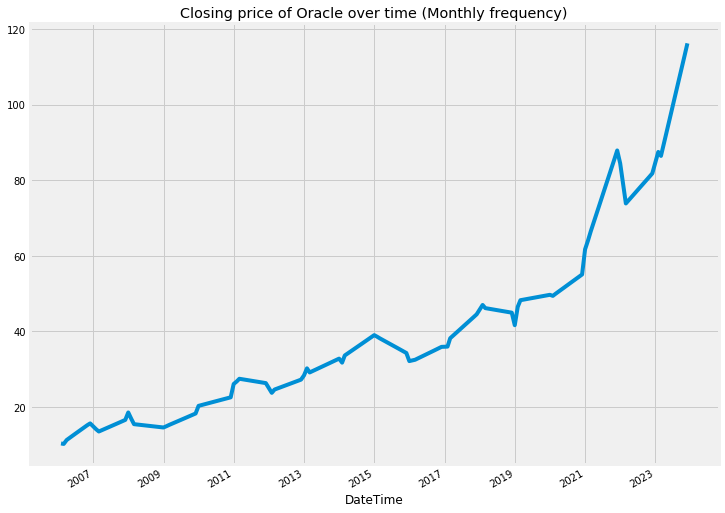

In [8]:
oracle["Close"].asfreq('M').interpolate().plot() # asfreq method is used to convert a time series to a specified frequency. 
                                                 # Here it is monthly frequency. Also using interpolate() to fix the gaps between the timeseries
plt.title('Closing price of Oracle over time (Monthly frequency)')
plt.show()

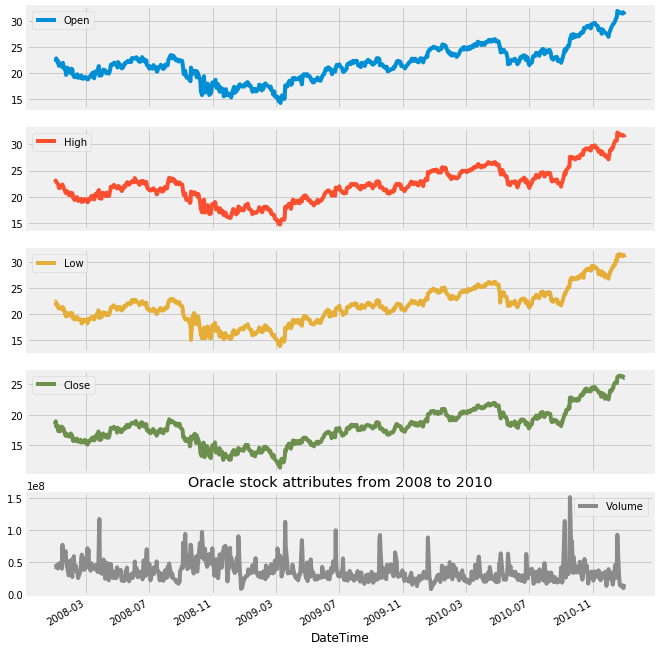

In [9]:
oracle['2008':'2010'].plot(subplots=True, figsize=(10,12))
plt.title('Oracle stock attributes from 2008 to 2010')
plt.savefig('Oracle.png')
plt.show()

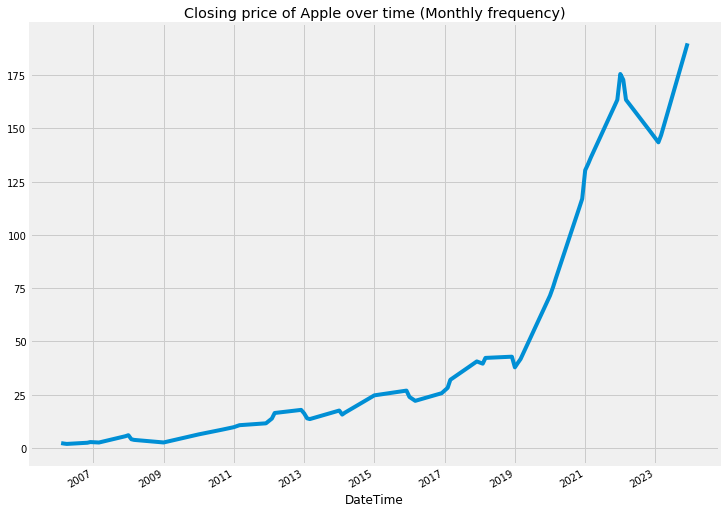

In [10]:
apple["Close"].asfreq('M').interpolate().plot() # asfreq method is used to convert a time series to a specified frequency. 
                                                 # Here it is monthly frequency. Also using interpolate() to fix the gaps between the timeseries
plt.title('Closing price of Apple over time (Monthly frequency)')
plt.show()

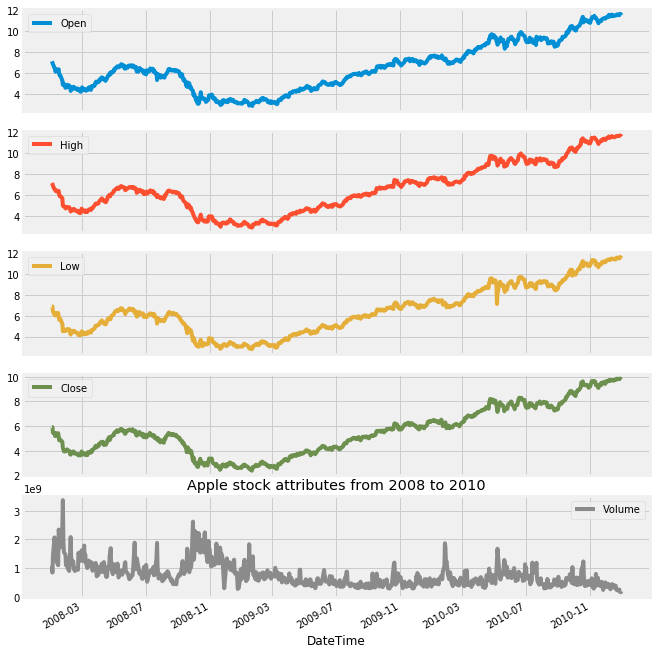

In [11]:
apple['2008':'2010'].plot(subplots=True, figsize=(10,12))
plt.title('Apple stock attributes from 2008 to 2010')
plt.savefig('Apple.png')
plt.show()

## <a id='1.4'>1.4 Timestamps and Periods</a>

### What are timestamps and periods and how are they useful?
Timestamps are used to represent a point in time. Periods represent an interval in time. Periods can used to check if a specific event in the given period. They can also be converted to each other's form.

In [12]:
# Creating a Timestamp
timestamp = pd.Timestamp(2017, 1, 1, 12)
timestamp

Timestamp('2017-01-01 12:00:00')

In [13]:
# Creating a period
period = pd.Period('2017-01-01')
period

Period('2017-01-01', 'D')

In [14]:
# Checking if the given timestamp exists in the given period
period.start_time < timestamp < period.end_time

True

In [15]:
# Converting timestamp to period
new_period = timestamp.to_period(freq='H')
new_period

Period('2017-01-01 12:00', 'H')

In [16]:
# Converting period to timestamp
new_timestamp = period.to_timestamp(freq='H', how='start')
new_timestamp

Timestamp('2017-01-01 00:00:00')

## <a id='1.5'>1.5 Using date_range</a>

### What is date_range and how is it useful?
**date_range** is a method that returns  a fixed frequency datetimeindex. It is quite useful when creating your own time series attribute for pre-existing data or arranging the whole data around the time series attribute created by you.

In [17]:
# Creating a datetimeindex with daily frequency
dr1 = pd.date_range(start='1/1/18', end='1/9/18')
dr1

DatetimeIndex(['2018-01-01', '2018-01-02', '2018-01-03', '2018-01-04',
               '2018-01-05', '2018-01-06', '2018-01-07', '2018-01-08',
               '2018-01-09'],
              dtype='datetime64[ns]', freq='D')

In [18]:
# Creating a datetimeindex with monthly frequency
dr2 = pd.date_range(start='1/1/18', end='1/1/19', freq='M')
dr2

DatetimeIndex(['2018-01-31', '2018-02-28', '2018-03-31', '2018-04-30',
               '2018-05-31', '2018-06-30', '2018-07-31', '2018-08-31',
               '2018-09-30', '2018-10-31', '2018-11-30', '2018-12-31'],
              dtype='datetime64[ns]', freq='M')

In [19]:
# Creating a datetimeindex without specifying start date and using periods
dr3 = pd.date_range(end='1/4/2014', periods=8)
dr3

DatetimeIndex(['2013-12-28', '2013-12-29', '2013-12-30', '2013-12-31',
               '2014-01-01', '2014-01-02', '2014-01-03', '2014-01-04'],
              dtype='datetime64[ns]', freq='D')

In [20]:
# Creating a datetimeindex specifying start date , end date and periods
dr4 = pd.date_range(start='2013-04-24', end='2014-11-27', periods=3)
dr4

DatetimeIndex(['2013-04-24', '2014-02-09', '2014-11-27'], dtype='datetime64[ns]', freq=None)

## <a id='1.6'>1.6 Using to_datetime</a> 

pandas.to_datetime() is used for converting arguments to datetime. Here, a DataFrame is converted to a datetime series.

In [21]:
df = pd.DataFrame({'year': [2015, 2016], 'month': [2, 3], 'day': [4, 5]})
df

,year,month,day
0,2015,2,4
1,2016,3,5


In [22]:
df = pd.to_datetime(df)
df

0   2015-02-04
1   2016-03-05
dtype: datetime64[ns]

In [23]:
df = pd.to_datetime('01-01-2017')
df

Timestamp('2017-01-01 00:00:00')

## <a id='1.7'>1.7 Shifting and lags</a>

We can shift index by desired number of periods with an optional time frequency. This is useful when comparing the time series with a past of itself

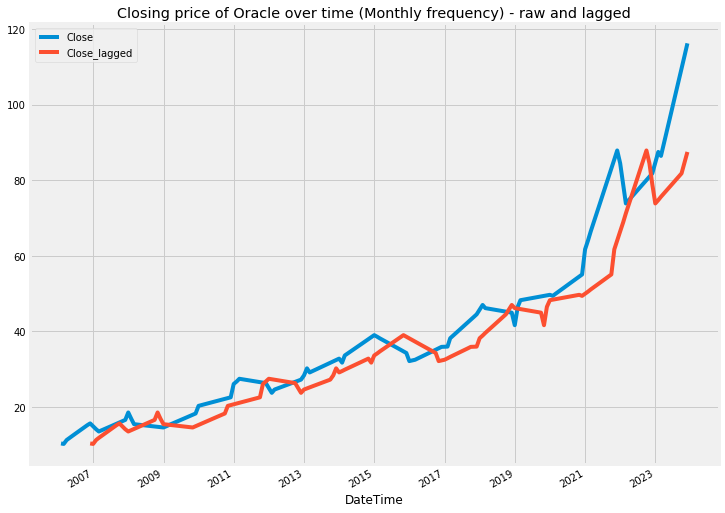

In [24]:
oracle["Close"].asfreq('M').interpolate().plot(legend=True)
shifted = oracle["Close"].asfreq('M').interpolate().shift(10).plot(legend=True)
shifted.legend(['Close','Close_lagged'])
plt.title('Closing price of Oracle over time (Monthly frequency) - raw and lagged')
plt.show()

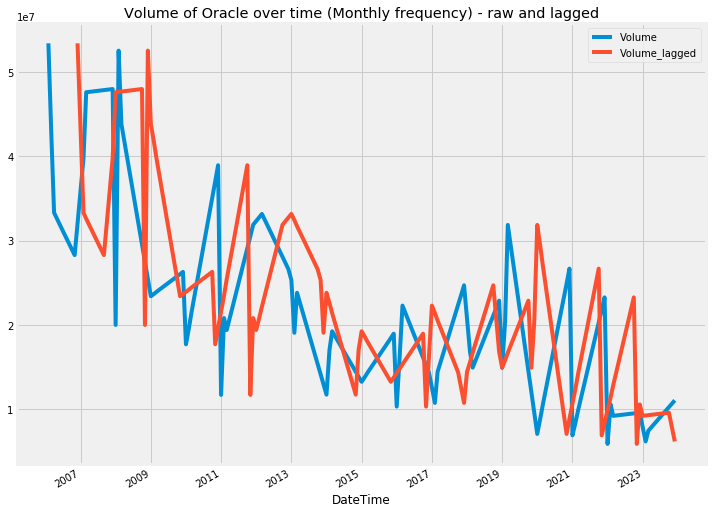

In [25]:
oracle["Volume"].asfreq('M').interpolate().plot(legend=True)
shifted = oracle["Volume"].asfreq('M').interpolate().shift(10).plot(legend=True)
shifted.legend(['Volume','Volume_lagged'])
plt.title('Volume of Oracle over time (Monthly frequency) - raw and lagged')
plt.show()

## <a id='#1.8'>1.8 Resampling</a>
**Upsampling** - Time series is resampled from low frequency to high frequency (Monthly to daily frequency). It involves filling or interpolating missing data

**Downsampling** - Time series is resampled from high frequency to low frequency (Weekly to monthly frequency). It involves aggregation of existing data.


In case there were missing data, we would use **ffill** parameter which propagates last valid observation to fill gaps. Then we would use **bfill** to propogate next valid observation to fill gaps.

_Forward filling missing data_

```python
data = data.iloc[1:]
data = data.fillna(method='ffill')
```

_Back filling missing data_

```python
data = data.fillna(method='bfill')
data.head()
```

In [26]:
# Shape before resampling(downsampling)
oracle.shape

(4515, 6)

In [27]:
# We downsample from hourly to 3 day frequency aggregated using mean
oracle_resampled = oracle.resample('3D').mean()
oracle_resampled.head()

,Open,High,Low,Close,Volume
DateTime,,,,,
2006-01-03 14:30:00,12.47,12.833333,12.453334,10.383411,5.504773e+07
2006-01-06 14:30:00,12.80,13.150000,12.750000,10.752201,9.506760e+07
2006-01-09 14:30:00,12.82,12.860000,12.623333,10.407997,5.096383e+07
2006-01-12 14:30:00,12.61,12.640000,12.425000,10.256383,3.849840e+07
2006-01-15 14:30:00,12.46,12.540000,12.400000,10.194919,2.259370e+07


In [28]:
# Shape after resampling(downsampling)
oracle_resampled.shape

(2183, 5)

Much less rows are left. Now, we will upsample from 3 day frequency to daily frequency

In [29]:
oracle_resampled = oracle.resample('D').pad()
oracle_resampled.head()

,Open,High,Low,Close,Volume,Name
DateTime,,,,,,
2006-01-03,NaN,NaN,NaN,NaN,NaN,NaN
2006-01-04,12.23,12.80,12.22,10.326045,56073800.0,ORCL
2006-01-05,12.56,12.78,12.54,10.342435,56412300.0,ORCL
2006-01-06,12.62,12.92,12.60,10.481752,52657100.0,ORCL
2006-01-07,12.80,13.15,12.75,10.752201,95067600.0,ORCL


In [30]:
# Shape after resampling(upsampling)
oracle_resampled.shape

(6549, 6)

Again an increase in number of rows. Resampling is cool when used properly.

# <a id='2'>2. Finance and statistics</a>

## <a id='2.1'>2.1 Percent change</a>

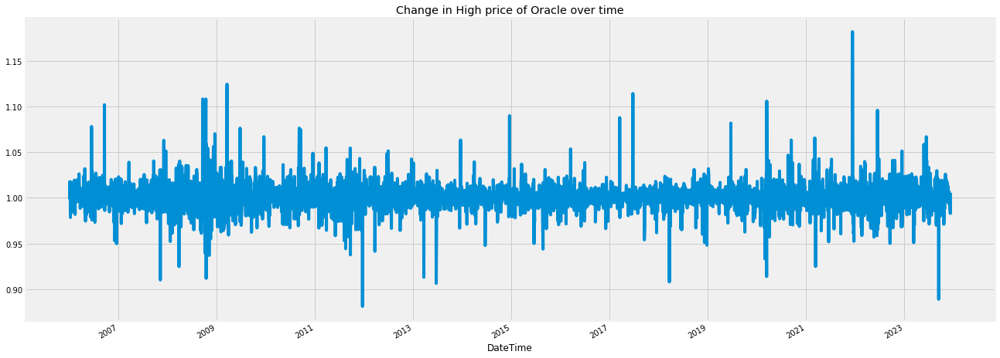

In [31]:
oracle['Change'] = oracle.High.div(oracle.High.shift())
oracle['Change'].plot(figsize=(20,8))
_ = plt.title('Change in High price of Oracle over time')

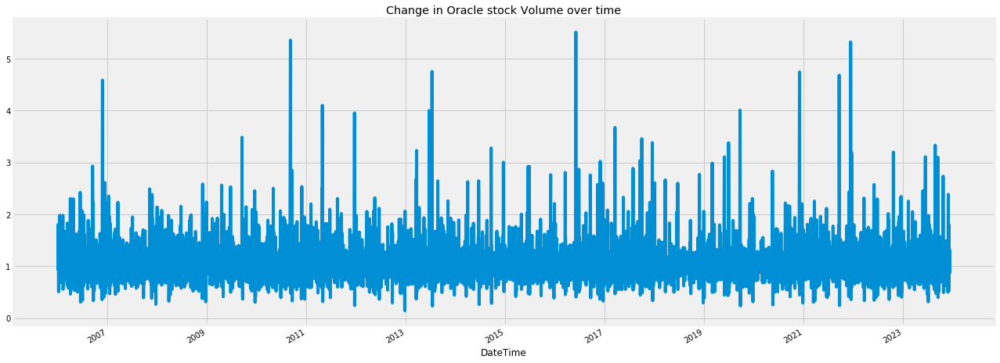

In [32]:
oracle['Volume_Change'] = oracle.Volume.div(oracle.Volume.shift())
oracle['Volume_Change'].plot(figsize=(20,8))
_ = plt.title('Change in Oracle stock Volume over time')

## <a id='2.2'>2.2 Stock returns</a> 

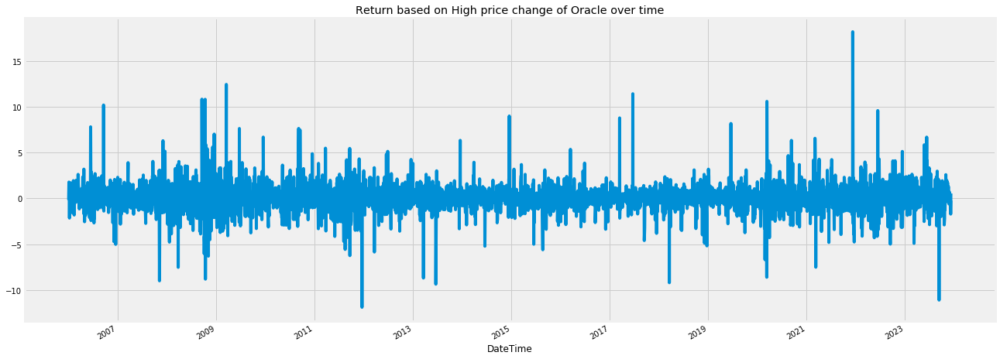

In [33]:
oracle['Return'] = oracle.Change.sub(1).mul(100)
oracle['Return'].plot(figsize=(20,8))
_ = plt.title('Return based on High price change of Oracle over time')

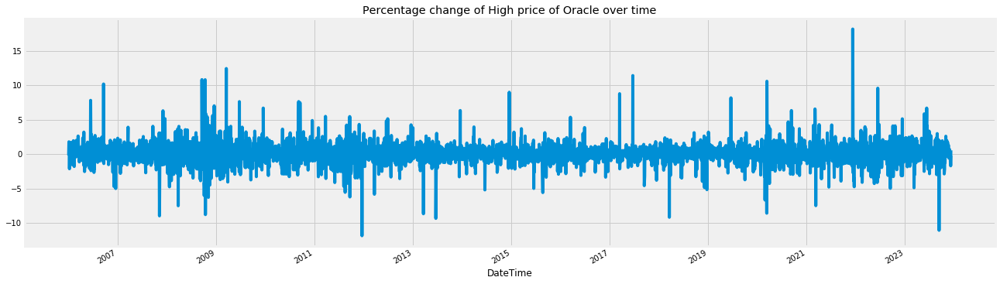

In [34]:
oracle.High.pct_change().mul(100).plot(figsize=(20,6)) # Another way to calculate returns
_ = plt.title('Percentage change of High price of Oracle over time')

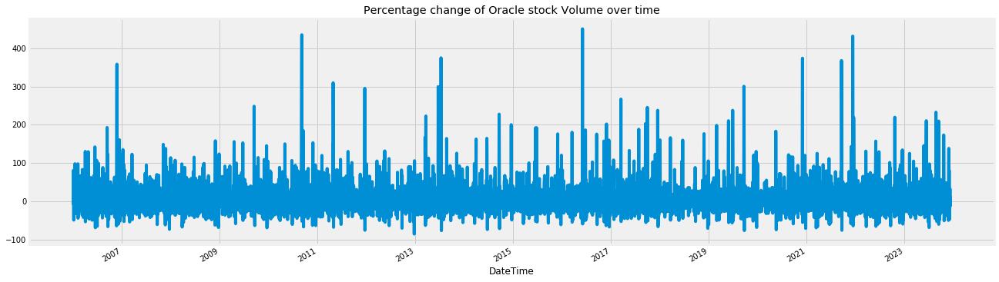

In [35]:
oracle.Volume.pct_change().mul(100).plot(figsize=(20,6)) # Another way to calculate returns
_ = plt.title('Percentage change of Oracle stock Volume over time')

## <a id='2.3'>2.3 Absolute change in successive rows</a>

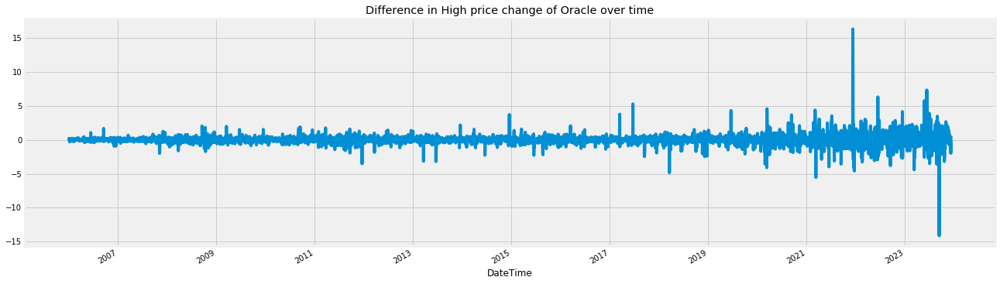

In [36]:
oracle.High.diff().plot(figsize=(20,6))
_ = plt.title('Difference in High price change of Oracle over time')

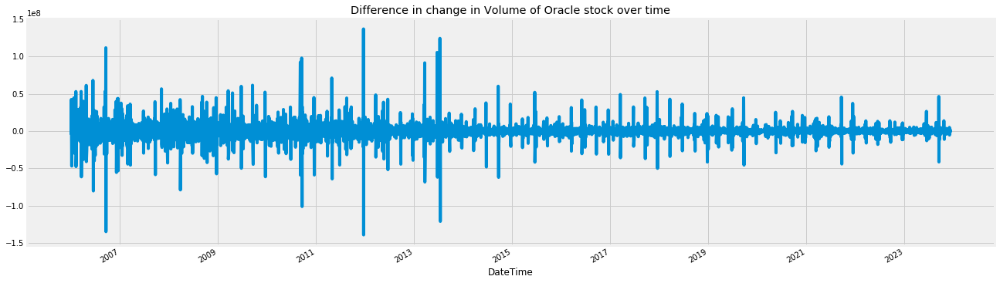

In [37]:
oracle.Volume.diff().plot(figsize=(20,6))
_ = plt.title('Difference in change in Volume of Oracle stock over time')

## <a id='2.4'>2.4 Comparing two or more time series</a> 

We will compare 2 time series by normalizing them. This is achieved by dividing each time series element of all time series by the first element. This way both series start at the same point and can be easily compared.

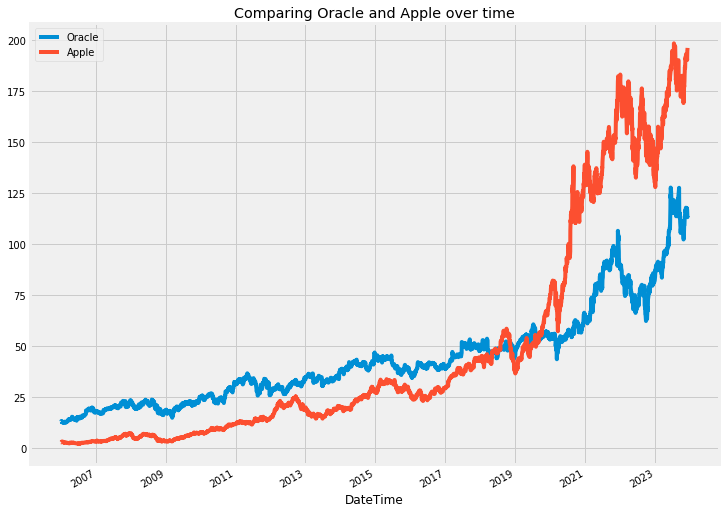

In [38]:
# Plotting before normalization
oracle.High.plot()
apple.High.plot()
plt.legend(['Oracle','Apple'])
_ = plt.title('Comparing Oracle and Apple over time')
plt.show()

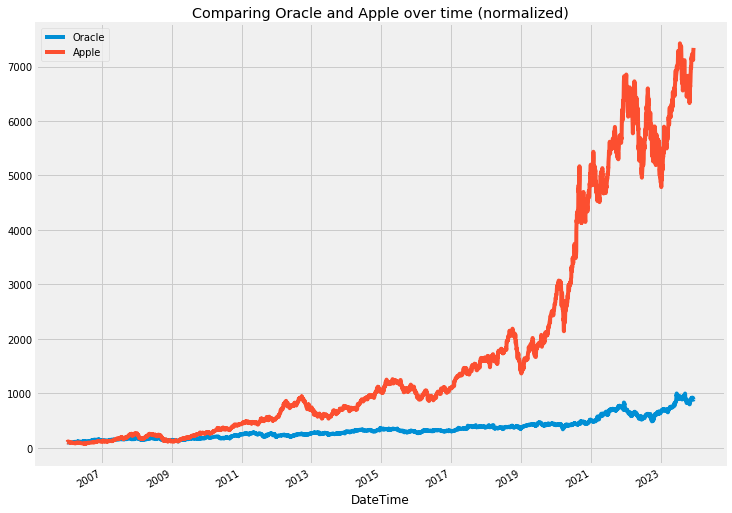

In [39]:
# Normalizing and comparison
# Both stocks start from 100
normalized_oracle = oracle.High.div(oracle.High.iloc[0]).mul(100)
normalized_apple = apple.High.div(apple.High.iloc[0]).mul(100)
normalized_oracle.plot()
normalized_apple.plot()
_ = plt.title('Comparing Oracle and Apple over time (normalized)')
plt.legend(['Oracle','Apple'])
plt.show()

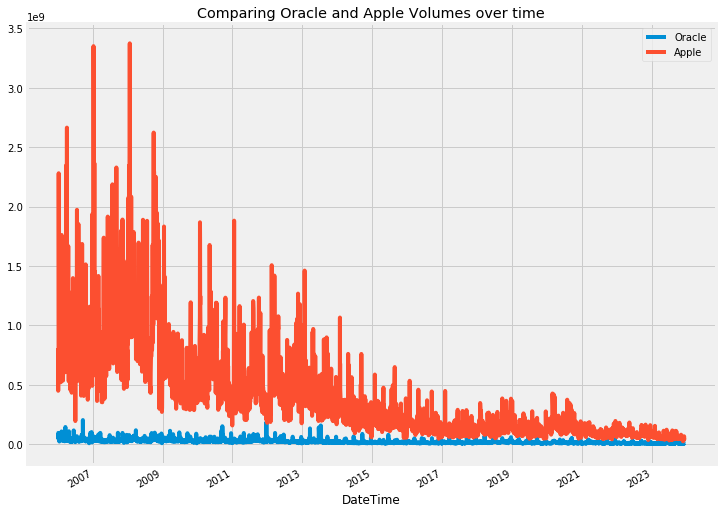

In [40]:
# Plotting before normalization
oracle.Volume.plot()
apple.Volume.plot()
plt.legend(['Oracle','Apple'])
_ = plt.title('Comparing Oracle and Apple Volumes over time')
plt.show()

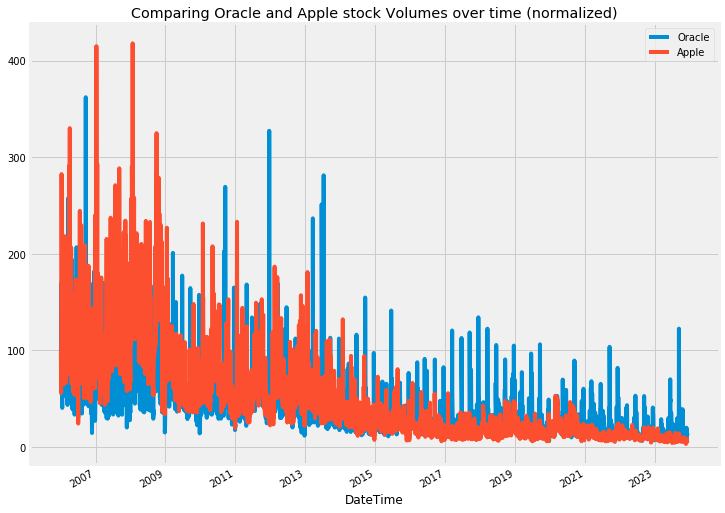

In [41]:
# Normalizing and comparison
# Both stocks start from 100
normalized_oracle = oracle.Volume.div(oracle.Volume.iloc[0]).mul(100)
normalized_apple = apple.Volume.div(apple.Volume.iloc[0]).mul(100)
normalized_oracle.plot()
normalized_apple.plot()
_ = plt.title('Comparing Oracle and Apple stock Volumes over time (normalized)')
plt.legend(['Oracle','Apple'])
plt.show()

You can clearly see how Apple outperforms Oracle over time.

## <a id='2.5'>2.5 Window functions</a>
Window functions are used to identify sub periods, calculates sub-metrics of sub-periods.

**Rolling** - Same size and sliding

**Expanding** - Contains all prior values

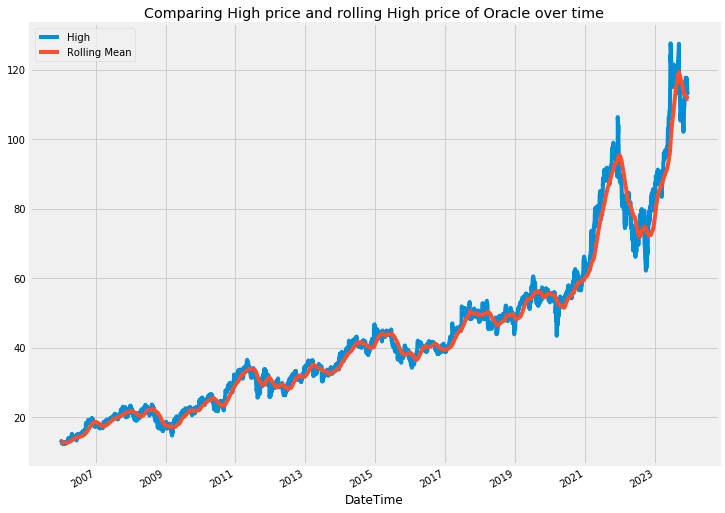

In [42]:
# Rolling window functions
rolling_oracle = oracle.High.rolling('90D').mean()
oracle.High.plot()
rolling_oracle.plot()
_ = plt.title('Comparing High price and rolling High price of Oracle over time')
plt.legend(['High','Rolling Mean'])
# Plotting a rolling mean of 90 day window with original High attribute of Oracle stocks
plt.show()

Now, observe that rolling mean plot is a smoother version of the original plot.

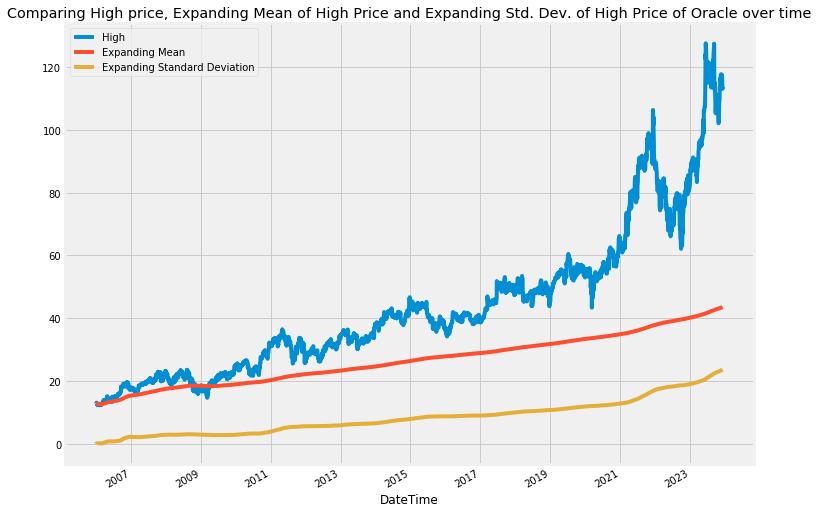

In [43]:
# Expanding window functions
oracle_mean = oracle.High.expanding().mean()
oracle_std = oracle.High.expanding().std()
oracle.High.plot()
oracle_mean.plot()
oracle_std.plot()
_ = plt.title('Comparing High price, Expanding Mean of High Price and Expanding Std. Dev. of High Price of Oracle over time')
plt.legend(['High','Expanding Mean','Expanding Standard Deviation'])
plt.show()

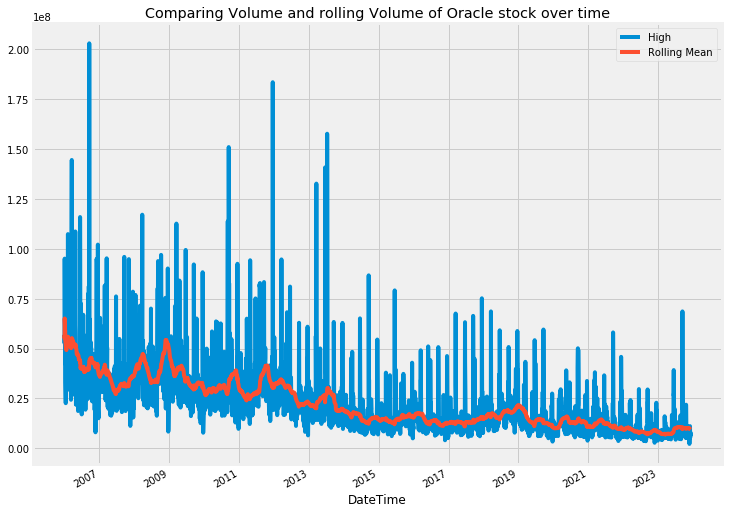

In [44]:
# Rolling window functions
rolling_oracle = oracle.Volume.rolling('90D').mean()
oracle.Volume.plot()
rolling_oracle.plot()
_ = plt.title('Comparing Volume and rolling Volume of Oracle stock over time')
plt.legend(['High','Rolling Mean'])
# Plotting a rolling mean of 90 day window with original High attribute of Oracle stocks
plt.show()

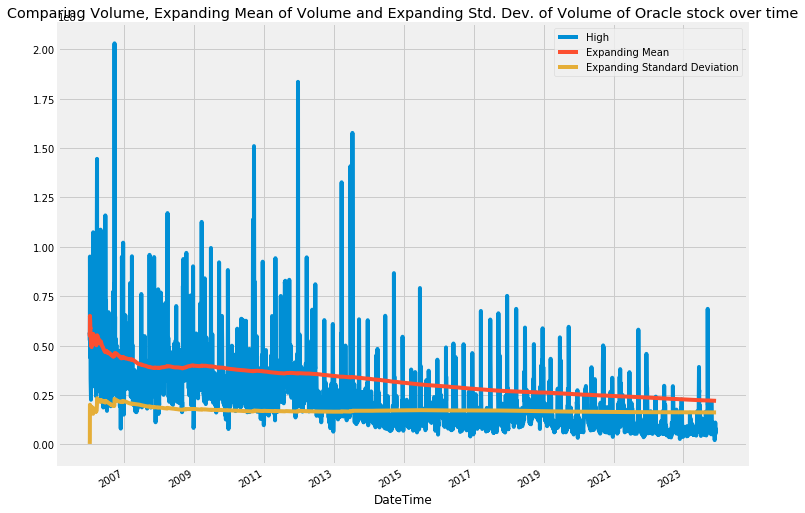

In [45]:
# Expanding window functions
oracle_mean = oracle.Volume.expanding().mean()
oracle_std = oracle.Volume.expanding().std()
oracle.Volume.plot()
oracle_mean.plot()
oracle_std.plot()
_ = plt.title('Comparing Volume, Expanding Mean of Volume and Expanding Std. Dev. of Volume of Oracle stock over time')
plt.legend(['High','Expanding Mean','Expanding Standard Deviation'])
plt.show()

## <a id='2.6'>2.6 OHLC charts</a>
An OHLC chart is any type of price chart that shows the open, high, low and close price of a certain time period. Open-high-low-close Charts (or OHLC Charts) are used as a trading tool to visualise and analyse the price changes over time for securities, currencies, stocks, bonds, commodities, etc. OHLC Charts are useful for interpreting the day-to-day sentiment of the market and forecasting any future price changes through the patterns produced.

The y-axis on an OHLC Chart is used for the price scale, while the x-axis is the timescale. On each single time period, an OHLC Charts plots a symbol that represents two ranges: the highest and lowest prices traded, and also the opening and closing price on that single time period (for example in a day). On the range symbol, the high and low price ranges are represented by the length of the main vertical line. The open and close prices are represented by the vertical positioning of tick-marks that appear on the left (representing the open price) and on right (representing the close price) sides of the high-low vertical line.

Colour can be assigned to each OHLC Chart symbol, to distinguish whether the market is "bullish" (the closing price is higher then it opened) or "bearish" (the closing price is lower then it opened).

<img src="https://datavizcatalogue.com/methods/images/anatomy/SVG/OHLC_chart.svg">

Source: [Datavizcatalogue](https://datavizcatalogue.com/methods/OHLC_chart.html)

In [46]:
# OHLC chart of June 2008
trace = go.Ohlc(x=oracle['06-2008'].index,
                open=oracle['06-2008'].Open,
                high=oracle['06-2008'].High,
                low=oracle['06-2008'].Low,
                close=oracle['06-2008'].Close)
data = [trace]
print('OHLC price chart of Oracle for June 2008')
iplot(data, filename='simple_ohlc')

OHLC price chart of Oracle for June 2008


In [47]:
# OHLC chart of 2008
trace = go.Ohlc(x=oracle['2008'].index,
                open=oracle['2008'].Open,
                high=oracle['2008'].High,
                low=oracle['2008'].Low,
                close=oracle['2008'].Close)
data = [trace]
print('OHLC price chart of Oracle for 2008')
iplot(data, filename='simple_ohlc')

OHLC price chart of Oracle for 2008


In [48]:
# OHLC chart of 2008
trace = go.Ohlc(x=oracle.index,
                open=oracle.Open,
                high=oracle.High,
                low=oracle.Low,
                close=oracle.Close)
data = [trace]
print('OHLC price chart of Oracle')
iplot(data, filename='simple_ohlc')

OHLC price chart of Oracle


 ## <a id='2.7'>2.7 Candlestick charts</a>
This type of chart is used as a trading tool to visualise and analyse the price movements over time for securities, derivatives, currencies, stocks, bonds, commodities, etc. Although the symbols used in Candlestick Charts resemble a Box Plot, they function differently and therefore, are not to be confused with one another.

Candlestick Charts display multiple bits of price information such as the open price, close price, highest price and lowest price through the use of candlestick-like symbols. Each symbol represents the compressed trading activity for a single time period (a minute, hour, day, month, etc). Each Candlestick symbol is plotted along a time scale on the x-axis, to show the trading activity over time.

The main rectangle in the symbol is known as the real body, which is used to display the range between the open and close price of that time period. While the lines extending from the bottom and top of the real body is known as the lower and upper shadows (or wick). Each shadow represents the highest or lowest price traded during the time period represented. When the market is Bullish (the closing price is higher than it opened), then the body is coloured typically white or green. But when the market is Bearish (the closing price is lower than it opened), then the body is usually coloured either black or red.

<img src="https://datavizcatalogue.com/methods/images/anatomy/SVG/candlestick_chart.svg">

Candlestick Charts are great for detecting and predicting market trends over time and are useful for interpreting the day-to-day sentiment of the market, through each candlestick symbol's colouring and shape. For example, the longer the body is, the more intense the selling or buying pressure is. While, a very short body, would indicate that there is very little price movement in that time period and represents consolidation.

Candlestick Charts help reveal the market psychology (the fear and greed experienced by sellers and buyers) through the various indicators, such as shape and colour, but also by the many identifiable patterns that can be found in Candlestick Charts. In total, there are 42 recognised patterns that are divided into simple and complex patterns. These patterns found in Candlestick Charts are useful for displaying price relationships and can be used for predicting the possible future movement of the market. You can find a list and description of each pattern here.

Please bear in mind, that Candlestick Charts don't express the events taking place between the open and close price - only the relationship between the two prices. So you can't tell how volatile trading was within that single time period.

Source: [Datavizcatalogue](https://datavizcatalogue.com/methods/candlestick_chart.html)

In [49]:
# Candlestick chart of march 2008
trace = go.Candlestick(x=oracle['03-2008'].index,
                open=oracle['03-2008'].Open,
                high=oracle['03-2008'].High,
                low=oracle['03-2008'].Low,
                close=oracle['03-2008'].Close)
data = [trace]
print('OHLC price chart (Candlestick) of Oracle for March 2008')
iplot(data, filename='simple_candlestick')

OHLC price chart (Candlestick) of Oracle for March 2008


In [50]:
# Candlestick chart of 2008
trace = go.Candlestick(x=oracle['2008'].index,
                open=oracle['2008'].Open,
                high=oracle['2008'].High,
                low=oracle['2008'].Low,
                close=oracle['2008'].Close)
data = [trace]
print('OHLC price chart (Candlestick) of Oracle for 2008')
iplot(data, filename='simple_candlestick')

OHLC price chart (Candlestick) of Oracle for 2008


In [51]:
# Candlestick chart of 2006-2018
trace = go.Candlestick(x=oracle.index,
                open=oracle.Open,
                high=oracle.High,
                low=oracle.Low,
                close=oracle.Close)
data = [trace]
print('OHLC price chart (Candlestick) of Oracle')
iplot(data, filename='simple_candlestick')

OHLC price chart (Candlestick) of Oracle


## <a id='2.8'>2.8 Autocorrelation and Partial Autocorrelation</a>
* Autocorrelation - The autocorrelation function (ACF) measures how a series is correlated with itself at different lags.
* Partial Autocorrelation - The partial autocorrelation function can be interpreted as a regression of the series against its past lags.  The terms can be interpreted the same way as a standard  linear regression, that is the contribution of a change in that particular lag while holding others constant. 

Source: [Quora](https://www.quora.com/What-is-the-difference-among-auto-correlation-partial-auto-correlation-and-inverse-auto-correlation-while-modelling-an-ARIMA-series)

## Autocorrelation

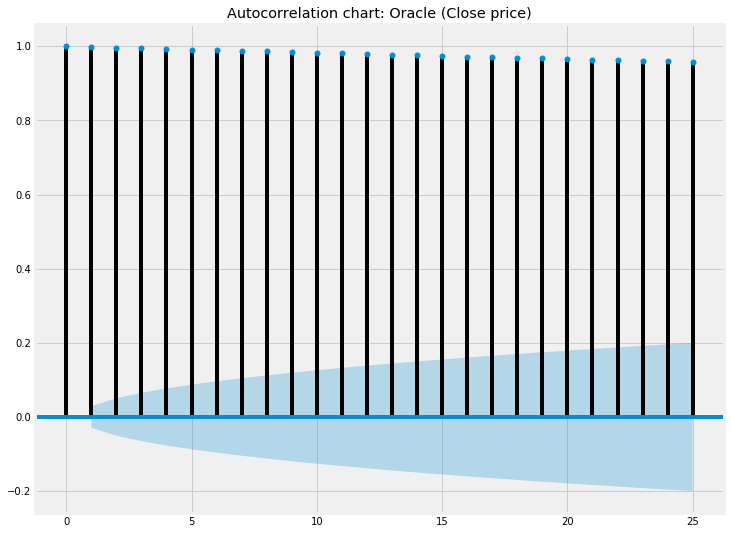

In [52]:
# Autocorrelation of Closing price of Oracle
plot_acf(oracle["Close"],lags=25,title="Autocorrelation chart: Oracle (Close price)")
plt.show()

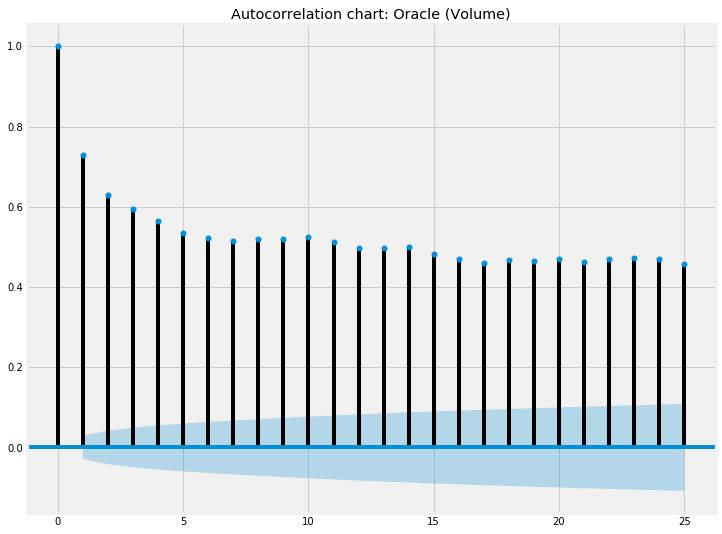

In [53]:
# Autocorrelation of Volume of Oracle stock
plot_acf(oracle["Volume"],lags=25,title="Autocorrelation chart: Oracle (Volume)")
plt.show()

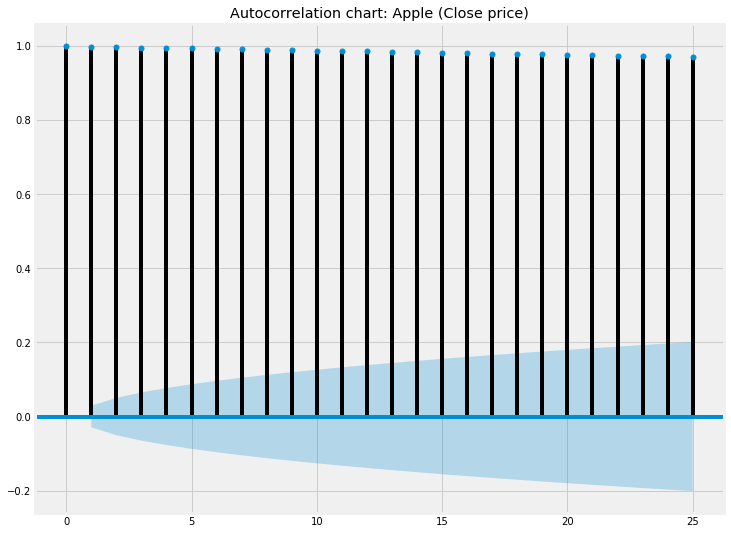

In [54]:
# Autocorrelation of Closing price of Apple
plot_acf(apple["Close"],lags=25,title="Autocorrelation chart: Apple (Close price)")
plt.show()

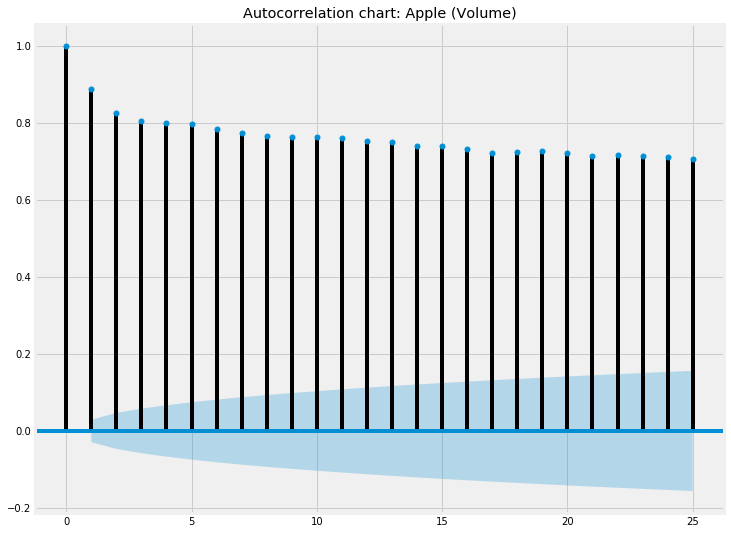

In [55]:
# Autocorrelation of Volume of Apple stock
plot_acf(apple["Volume"],lags=25,title="Autocorrelation chart: Apple (Volume)")
plt.show()

 As all lags are either close to 1 or at least greater than the confidence interval, they are statistically significant.

## Partial Autocorrelation

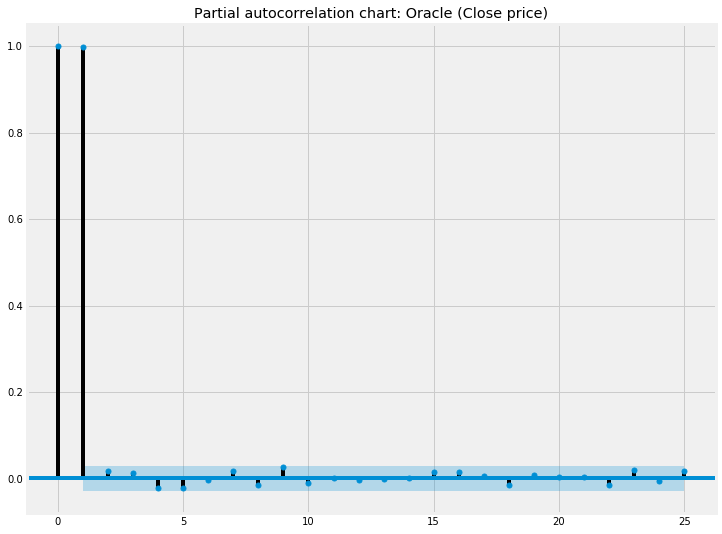

In [56]:
# Partial Autocorrelation of Closing price of Oracle
plot_pacf(oracle["Close"],lags=25, title="Partial autocorrelation chart: Oracle (Close price)")
plt.show()

Though it is statistically signficant, partial autocorrelation after first 2 lags is very low.

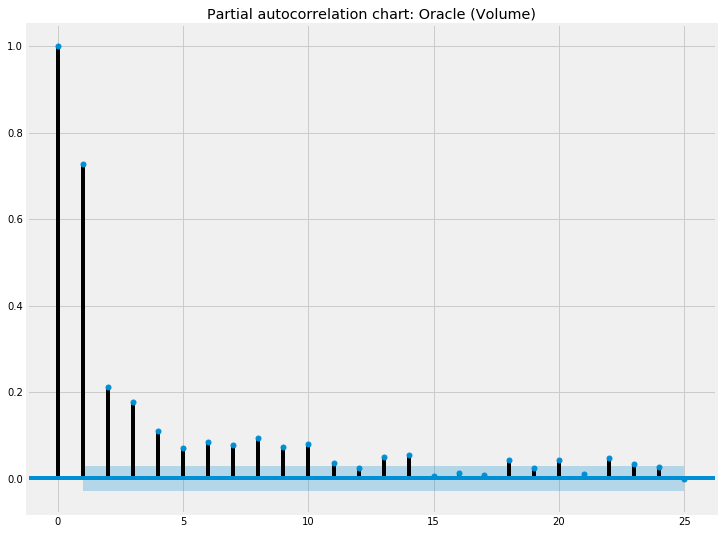

In [57]:
# Partial Autocorrelation of Volume of Oracle stock
plot_pacf(oracle["Volume"],lags=25, title="Partial autocorrelation chart: Oracle (Volume)")
plt.show()

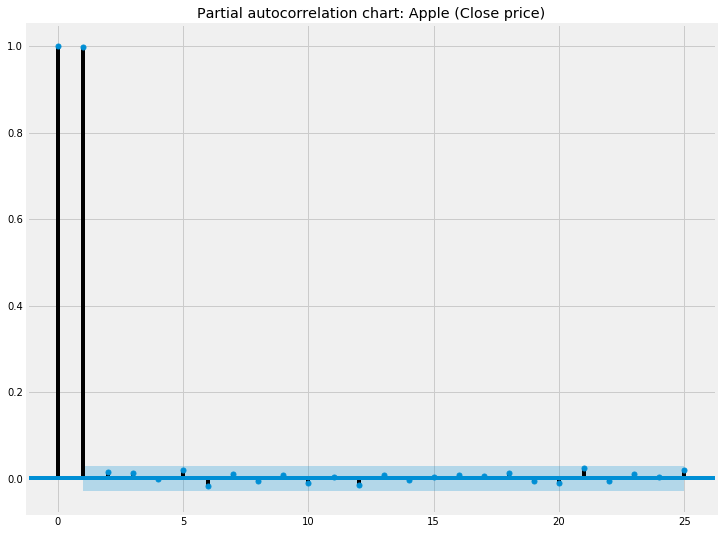

In [58]:
# Partial Autocorrelation of closing price of Apple 
plot_pacf(apple["Close"],lags=25, title="Partial autocorrelation chart: Apple (Close price)")
plt.show()

Here, only 0th and 1st lag are statistically significant.

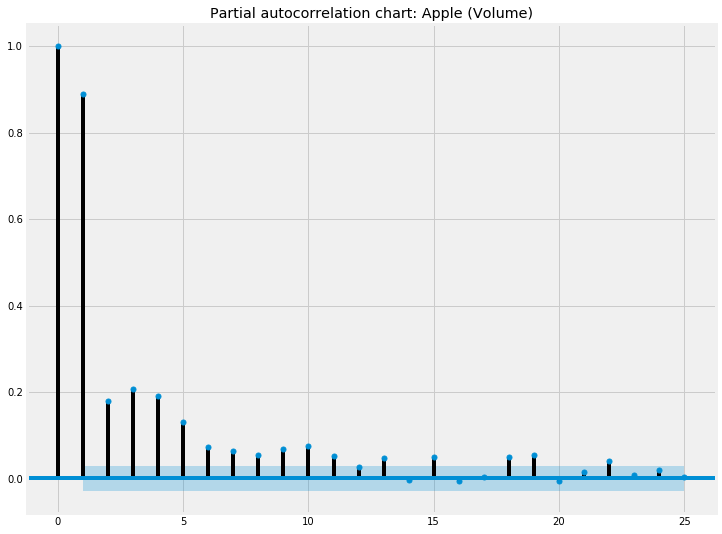

In [59]:
# Partial Autocorrelation of Volume of Apple stock
plot_pacf(apple["Volume"],lags=25, title="Partial autocorrelation chart: Apple (Volume)")
plt.show()

# <a id='3'>3. Time series decomposition and Random walks</a>

## <a id='3.1'>3.1. Trends, seasonality and noise</a>
These are the components of a time series
* Trend - Consistent upwards or downwards slope of a time series
* Seasonality - Clear periodic pattern of a time series(like sine funtion)
* Noise - Outliers or missing values

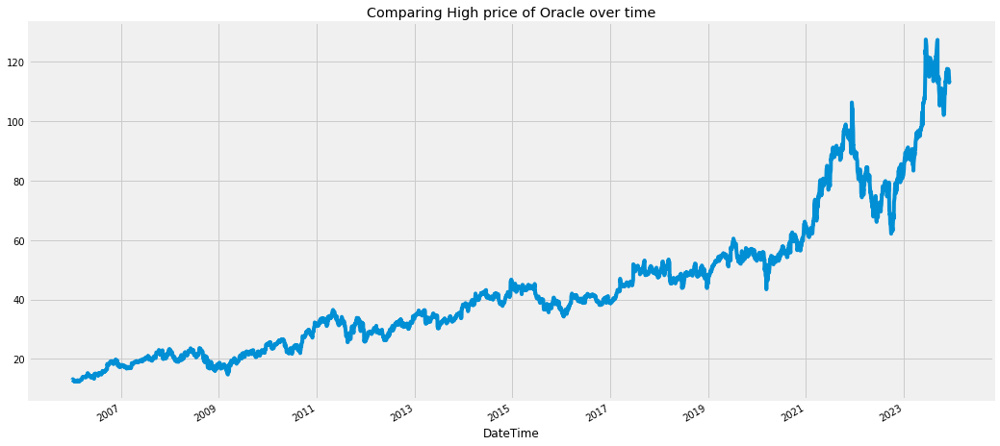

In [60]:
# Let's take Oracle stocks High for this
oracle["High"].plot(figsize=(16,8))
_ = plt.title('Comparing High price of Oracle over time')

Decomposing closing price of Oracle over time


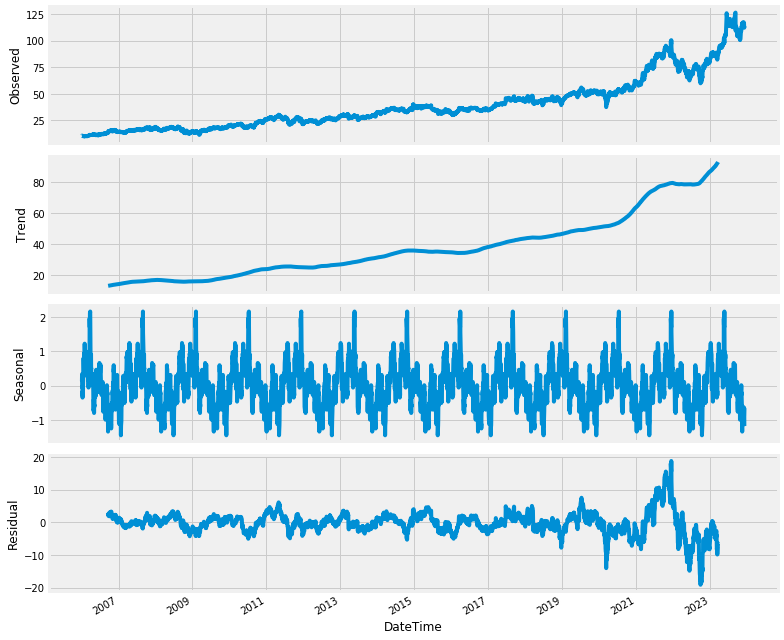

In [61]:
# Now, for decomposition...
print('Decomposing closing price of Oracle over time')
decomposed_oracle_close = sm.tsa.seasonal_decompose(oracle["Close"],freq=360) # The frequncy is annual
figure = decomposed_oracle_close.plot()
plt.show()

Decomposing volume data of Oracle over time


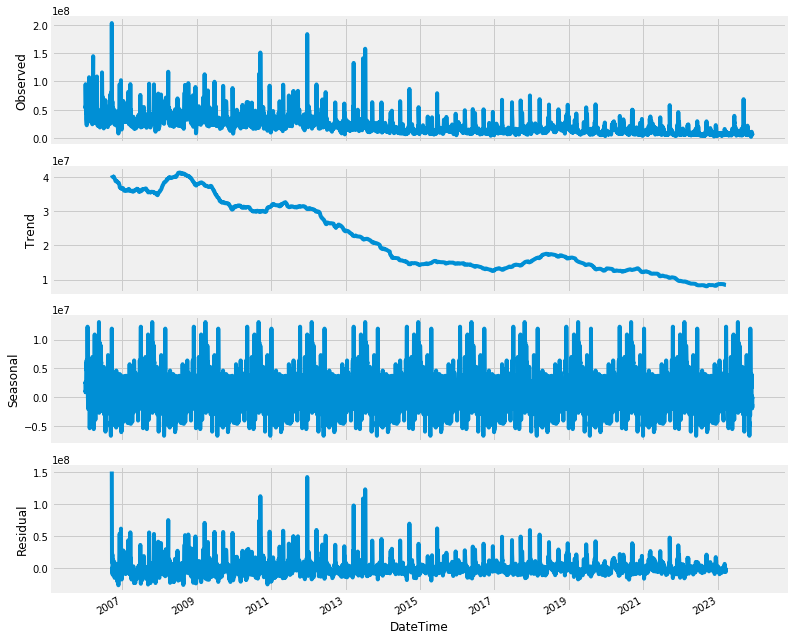

In [62]:
# Now, for decomposition...
print('Decomposing volume data of Oracle over time')
decomposed_oracle_volume = sm.tsa.seasonal_decompose(oracle["Volume"],freq=360) # The frequncy is annual
figure = decomposed_oracle_volume.plot()
plt.show()

* There is clearly an upward trend in the above plot.
* You can also see the uniform seasonal change.
* Non-uniform noise that represent outliers and missing values

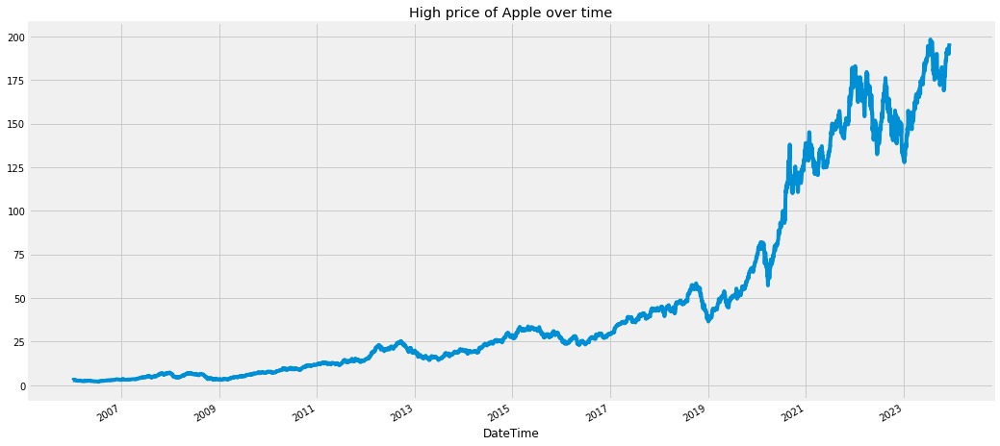

In [63]:
# Let's take Apple stocks High for this
apple["High"].plot(figsize=(16,8))
_ = plt.title('High price of Apple over time')

Decomposing closing price of Apple over time


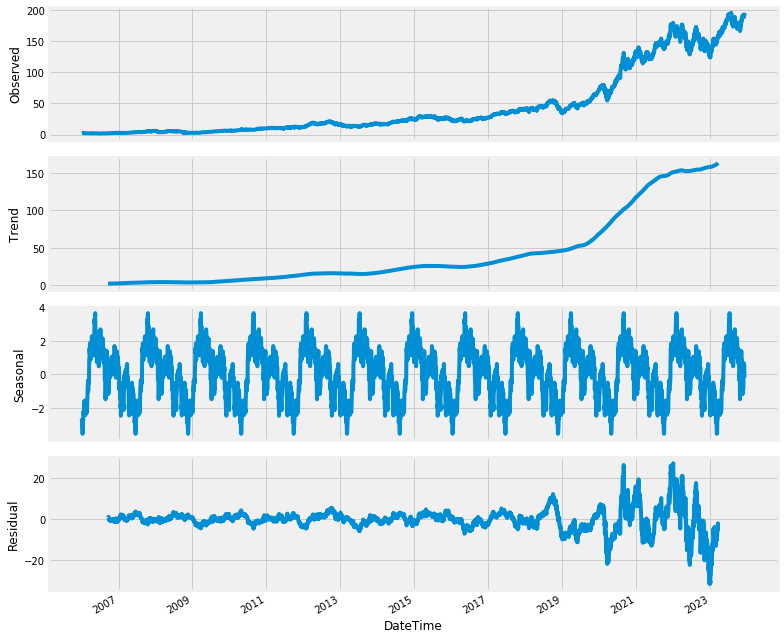

In [64]:
# Now, for decomposition...
print('Decomposing closing price of Apple over time')
decomposed_apple_close = sm.tsa.seasonal_decompose(apple["Close"],freq=360) # The frequncy is annual
figure = decomposed_apple_close.plot()
plt.show()

Decomposing volume data of Apple over time


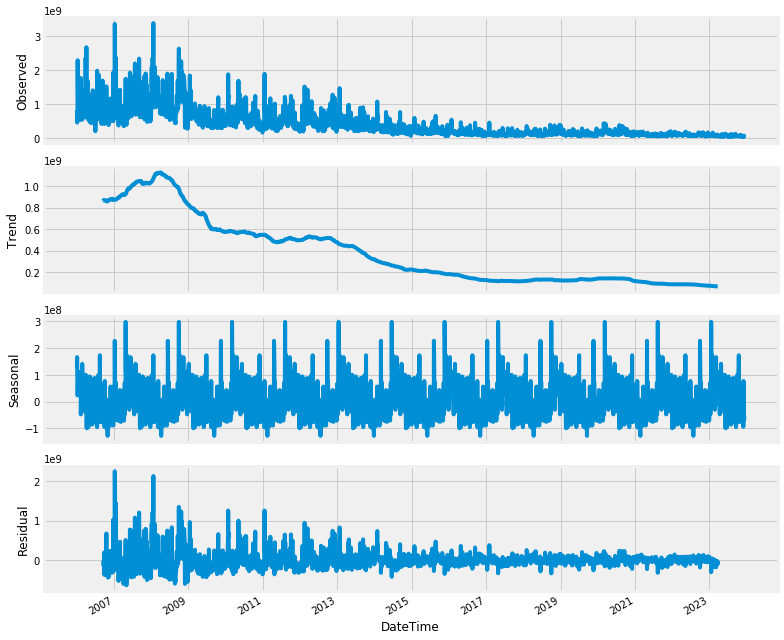

In [65]:
# Now, for decomposition...
print('Decomposing volume data of Apple over time')
decomposed_apple_volume = sm.tsa.seasonal_decompose(apple["Volume"],freq=360) # The frequncy is annual
figure = decomposed_apple_volume.plot()
plt.show()

## <a id='3.2'>3.2. White noise</a>
White noise has...
* Constant mean
* Constant variance
* Zero auto-correlation at all lags

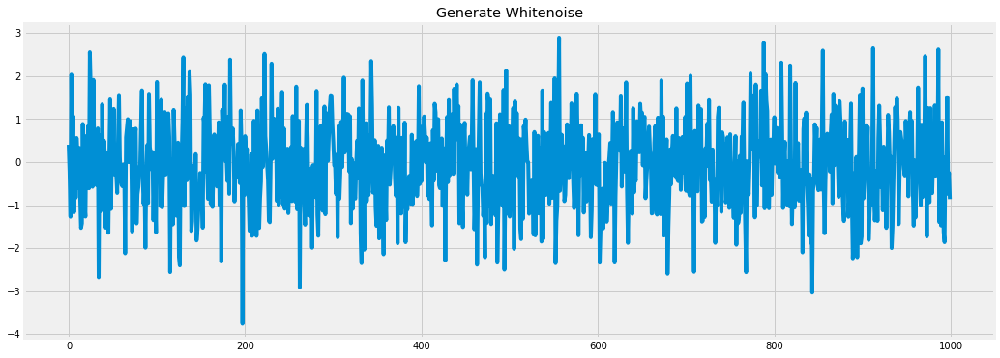

In [66]:
# Plotting white noise
rcParams['figure.figsize'] = 16, 6
white_noise = np.random.normal(loc=0, scale=1, size=1000)
_ = plt.title('Generate Whitenoise')
# loc is mean, scale is variance
plt.plot(white_noise)

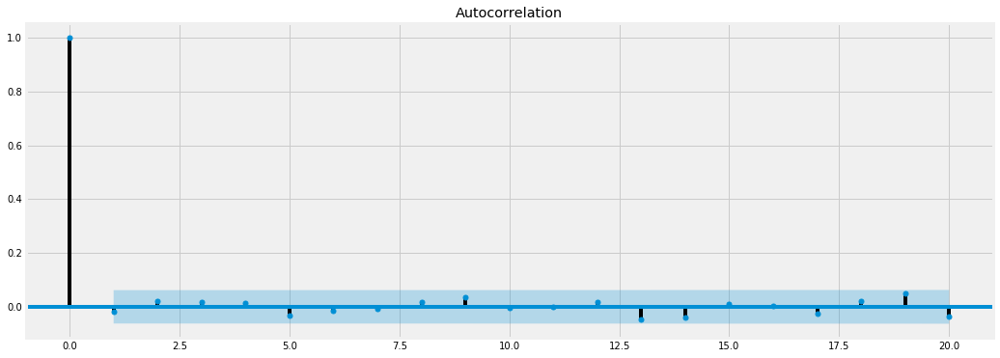

In [67]:
# Plotting autocorrelation of white noise
plot_acf(white_noise,lags=20)
plt.show()

See how all lags are statistically insigficant as they lie inside the confidence interval(shaded portion).

## <a id='3.3'>3.3. Random Walk</a>


### Augmented Dickey-Fuller test
An augmented Dickey–Fuller test (ADF) tests the null hypothesis that a unit root is present in a time series sample. It is basically Dickey-Fuller test with more lagged changes on RHS.

In [68]:
# Augmented Dickey-Fuller test on volume of Oracle and Apple stocks 
adf = adfuller(oracle["Volume"])
print("p-value of Oracle: {}".format(float(adf[1])))
adf = adfuller(apple["Volume"])
print("p-value of Apple: {}".format(float(adf[1])))

p-value of Oracle: 0.00015116612196786026
p-value of Apple: 0.041874212026890546


##### As Oracle has p-value 0.001213832346694128 which is less than 0.05, null hypothesis is rejected and this is not a random walk.
##### Now Apple has p-value 0.03835813336541477 which is also less than 0.05, null hypothesis is rejected and this is not a random walk.

### Generating a random walk

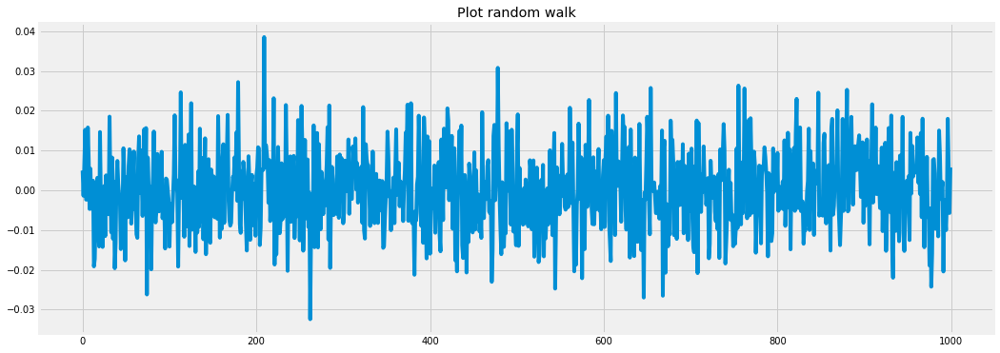

In [69]:
seed(42)
rcParams['figure.figsize'] = 16, 6
random_walk = normal(loc=0, scale=0.01, size=1000)
_ = plt.title('Plot random walk')
plt.plot(random_walk)
plt.show()

In [70]:
fig = ff.create_distplot([random_walk],['Random Walk'],bin_size=0.001)
print('Random walk data distribution')
iplot(fig, filename='Basic Distplot')

Random walk data distribution


## <a id='3.4'>3.4 Stationarity</a>
A stationary time series is one whose statistical properties such as mean, variance, autocorrelation, etc. are all constant over time.
* Strong stationarity:  is a stochastic process whose unconditional joint probability distribution does not change when shifted in time. Consequently, parameters such as mean and variance also do not change over time.
* Weak stationarity: is a process where mean, variance, autocorrelation are constant throughout the time

Stationarity is important as  non-stationary series that depend on time have too many parameters to account for when modelling the time series. diff() method can easily convert a non-stationary series to a stationary series.

We will try to decompose seasonal component of the above decomposed time series.

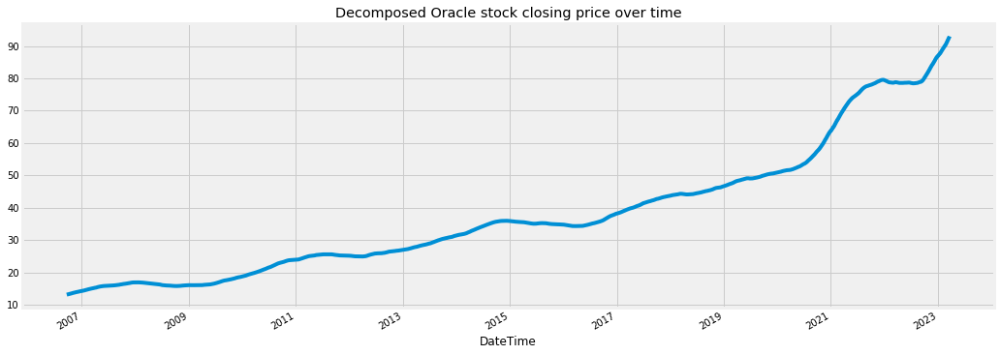

In [71]:
# The original non-stationary plot
decomposed_oracle_close.trend.plot()
_ = plt.title('Decomposed Oracle stock closing price over time')

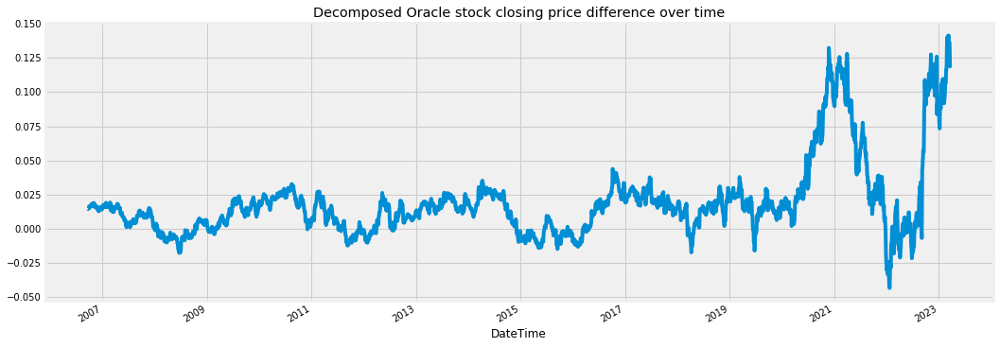

In [72]:
# The original non-stationary plot
decomposed_oracle_close.trend.diff().plot()
_ = plt.title('Decomposed Oracle stock closing price difference over time')

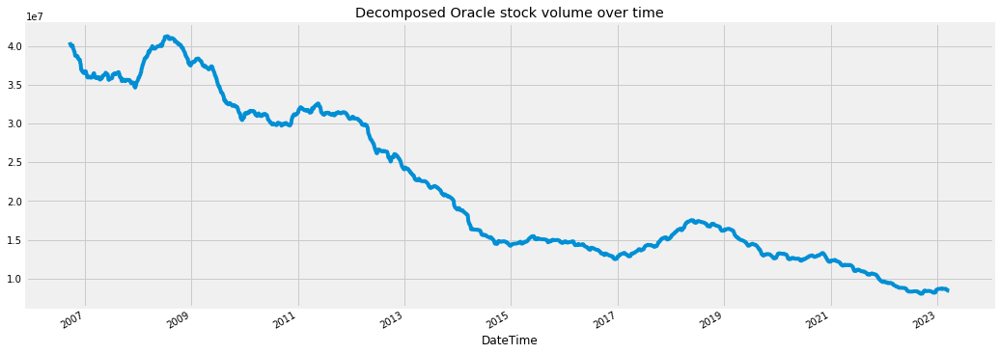

In [73]:
# The original non-stationary plot
decomposed_oracle_volume.trend.plot()
_ = plt.title('Decomposed Oracle stock volume over time')

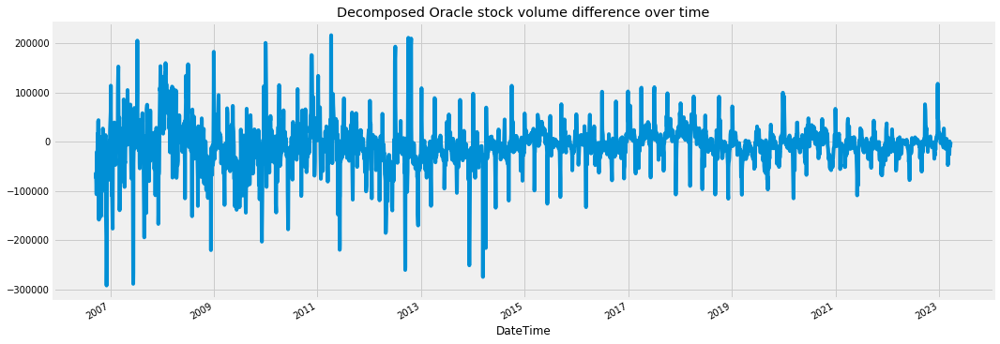

In [74]:
# The original non-stationary plot
decomposed_oracle_volume.trend.diff().plot()
_ = plt.title('Decomposed Oracle stock volume difference over time')

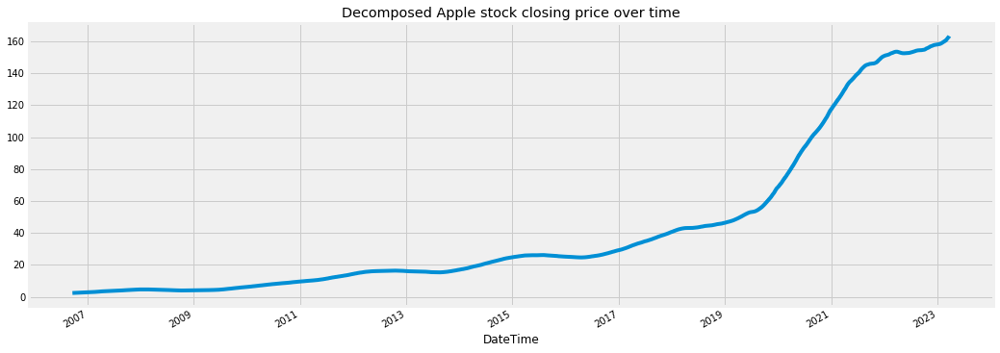

In [75]:
# The new stationary plot
decomposed_apple_close.trend.plot()
_ = plt.title('Decomposed Apple stock closing price over time')

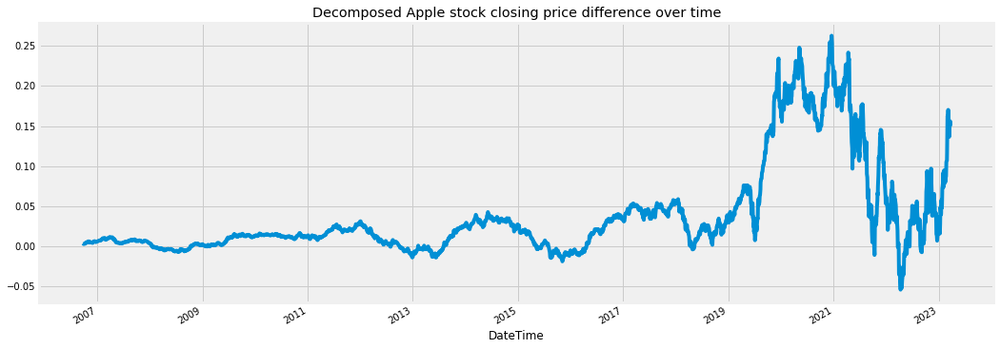

In [76]:
# The new stationary plot
decomposed_apple_close.trend.diff().plot()
_ = plt.title('Decomposed Apple stock closing price difference over time')

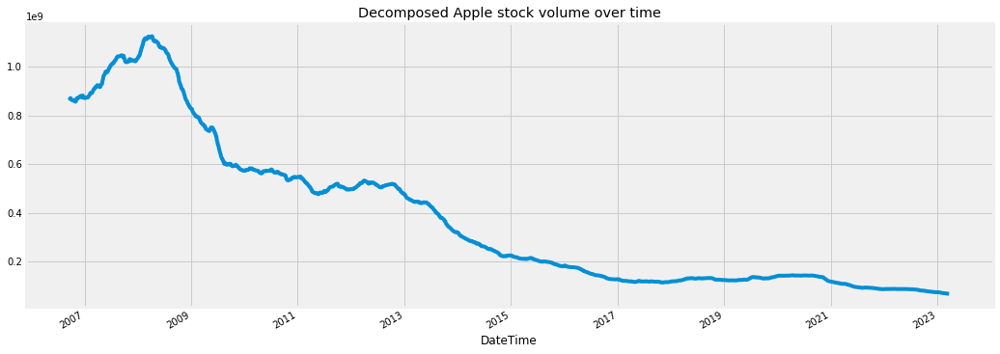

In [77]:
# The new stationary plot
decomposed_apple_volume.trend.plot()
_ = plt.title('Decomposed Apple stock volume over time')

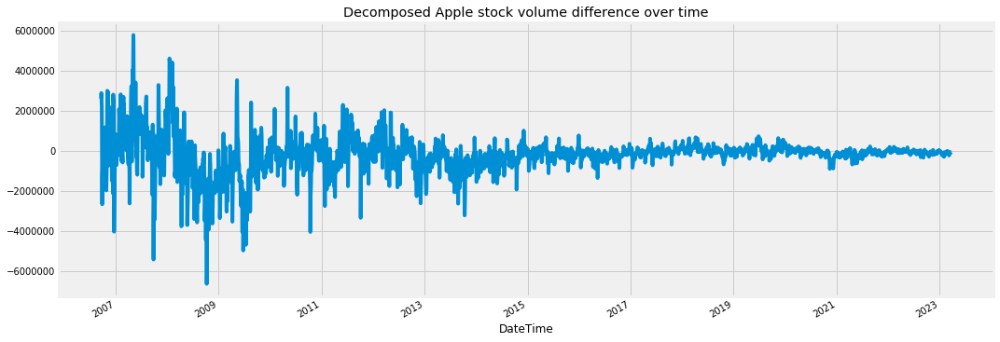

In [78]:
# The new stationary plot
decomposed_apple_volume.trend.diff().plot()
_ = plt.title('Decomposed Apple stock volume difference over time')

# <a id='4'>4. Modelling using statstools</a>

## <a id='4.1'>4.1 AR models</a>
 

## Simulating AR(1) model

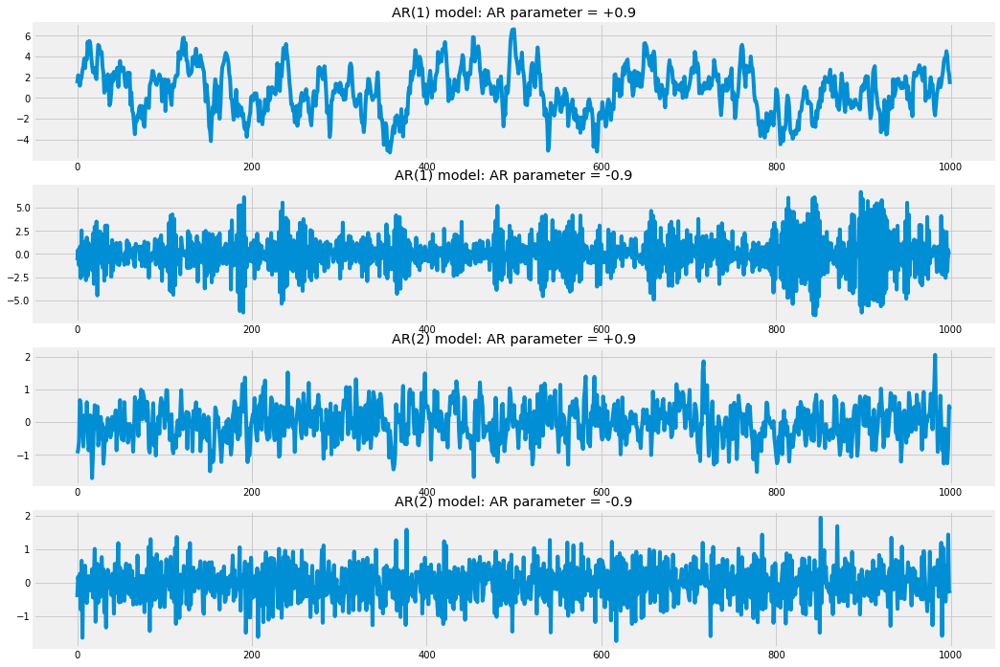

In [79]:
# AR(1) MA(1) model:AR parameter = +0.9
rcParams['figure.figsize'] = 16, 12
plt.subplot(4,1,1)
ar1 = np.array([1, -0.9]) # We choose -0.9 as AR parameter is +0.9
ma1 = np.array([1])
AR1 = ArmaProcess(ar1, ma1)
sim1 = AR1.generate_sample(nsample=1000)
plt.title('AR(1) model: AR parameter = +0.9')
plt.plot(sim1)
# We will take care of MA model later
# AR(1) MA(1) AR parameter = -0.9
plt.subplot(4,1,2)
ar2 = np.array([1, 0.9]) # We choose +0.9 as AR parameter is -0.9
ma2 = np.array([1])
AR2 = ArmaProcess(ar2, ma2)
sim2 = AR2.generate_sample(nsample=1000)
plt.title('AR(1) model: AR parameter = -0.9')
plt.plot(sim2)
# AR(2) MA(1) AR parameter = 0.9
plt.subplot(4,1,3)
ar3 = np.array([2, -0.9]) # We choose -0.9 as AR parameter is +0.9
ma3 = np.array([1])
AR3 = ArmaProcess(ar3, ma3)
sim3 = AR3.generate_sample(nsample=1000)
plt.title('AR(2) model: AR parameter = +0.9')
plt.plot(sim3)
# AR(2) MA(1) AR parameter = -0.9
plt.subplot(4,1,4)
ar4 = np.array([2, 0.9]) # We choose +0.9 as AR parameter is -0.9
ma4 = np.array([1])
AR4 = ArmaProcess(ar4, ma4)
sim4 = AR4.generate_sample(nsample=1000)
plt.title('AR(2) model: AR parameter = -0.9')
plt.plot(sim4)
plt.show()

## Forecasting a simulated model

In [80]:
model = ARMA(sim1, order=(1,0))
result = model.fit()
print(result.summary())
print("μ={} ,ϕ={}".format(result.params[0],result.params[1]))


                              ARMA Model Results                              
Dep. Variable:                      y   No. Observations:                 1000
Model:                     ARMA(1, 0)   Log Likelihood               -1415.701
Method:                       css-mle   S.D. of innovations              0.996
Date:                Sat, 09 Dec 2023   AIC                           2837.403
Time:                        00:08:10   BIC                           2852.126
Sample:                             0   HQIC                          2842.998
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.7072      0.288      2.454      0.014       0.142       1.272
ar.L1.y        0.8916      0.014     62.742      0.000       0.864       0.919
                                    Roots           

ϕ is around 0.9 which is what we chose as AR parameter in our first simulated model.

## Predicting the models

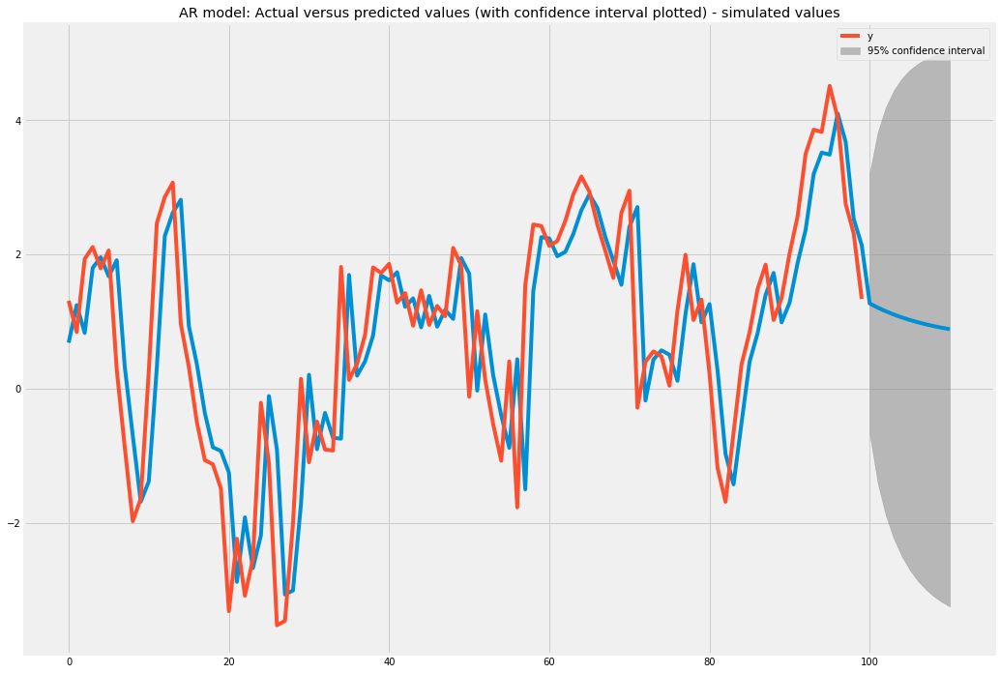

In [81]:
# Predicting simulated AR(1) model 
result.plot_predict(start=900, end=1010)
_ = plt.title('AR model: Actual versus predicted values (with confidence interval plotted) - simulated values')
plt.show()

In [82]:
rmse = math.sqrt(mean_squared_error(sim1[900:1011], result.predict(start=900,end=999)))
print("The root mean squared error is {}.".format(rmse))

The root mean squared error is 1.0408054544358292.


y is predicted plot. Quite neat!

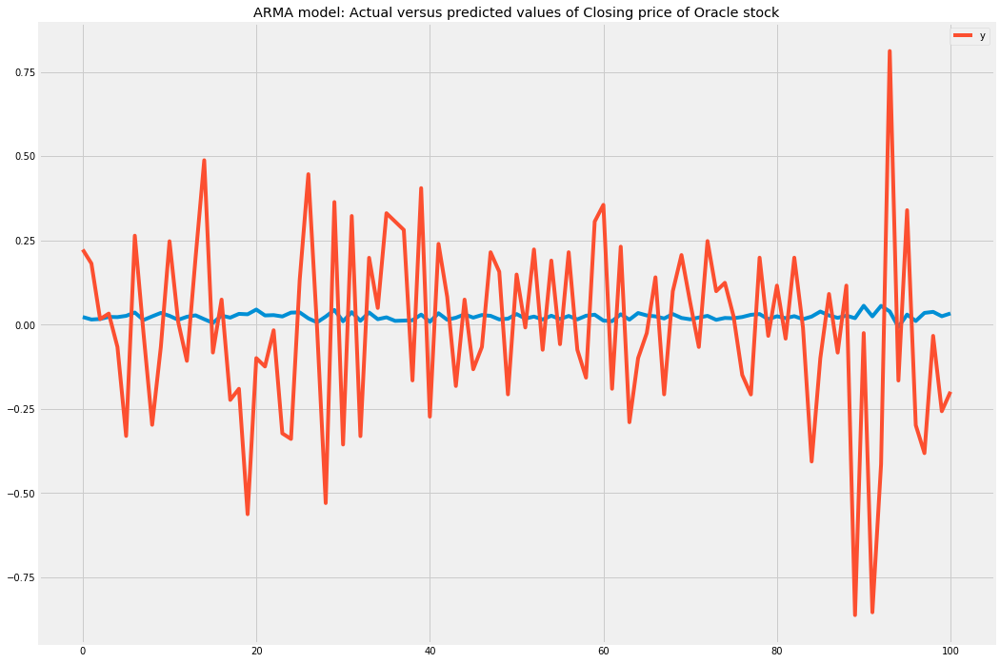

In [83]:
# Predicting Close price of Oracle
close_price = ARMA(oracle["Close"].diff().iloc[1:].values, order=(1,0))
res = close_price.fit()
res.plot_predict(start=1000, end=1100)
_ = plt.title('ARMA model: Actual versus predicted values of Closing price of Oracle stock')
plt.show()

In [84]:
rmse = math.sqrt(mean_squared_error(oracle["Close"].diff().iloc[900:1000].values, result.predict(start=900,end=999)))
print("The root mean squared error is {}.".format(rmse))

The root mean squared error is 1.75100940045462.


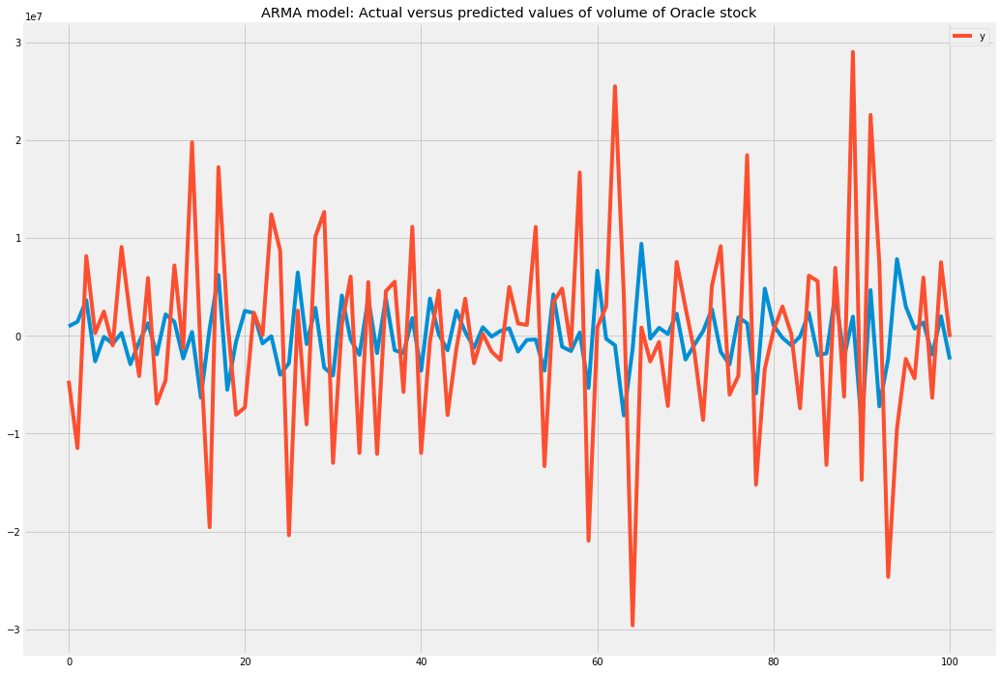

In [85]:
# Predicting Volume of Oracle
volume = ARMA(oracle["Volume"].diff().iloc[1:].values, order=(1,0))
res = volume.fit()
res.plot_predict(start=1000, end=1100)
_ = plt.title('ARMA model: Actual versus predicted values of volume of Oracle stock')
plt.show()

In [86]:
rmse = math.sqrt(mean_squared_error(oracle["Volume"].diff().iloc[900:1000].values, result.predict(start=900,end=999)))
print("The root mean squared error is {}.".format(rmse))

The root mean squared error is 13682916.453458484.


 Not quite impressive. But let's try Apple stocks. 

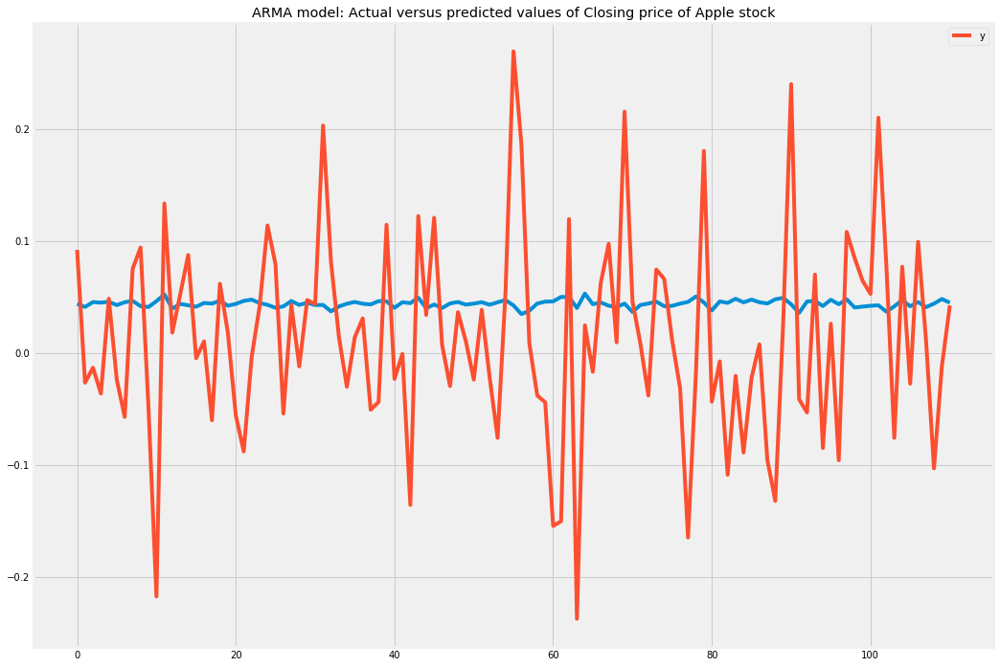

In [87]:
# Predicting closing prices of Apple
close_price = ARMA(apple["Close"].diff().iloc[1:].values, order=(1,0))
res = close_price.fit()
res.plot_predict(start=900, end=1010)
_ = plt.title('ARMA model: Actual versus predicted values of Closing price of Apple stock')
plt.show()

In [88]:
rmse = math.sqrt(mean_squared_error(apple["Close"].diff().iloc[900:1000].values, result.predict(start=900,end=999)))
print("The root mean squared error is {}.".format(rmse))

The root mean squared error is 1.7453062223275724.


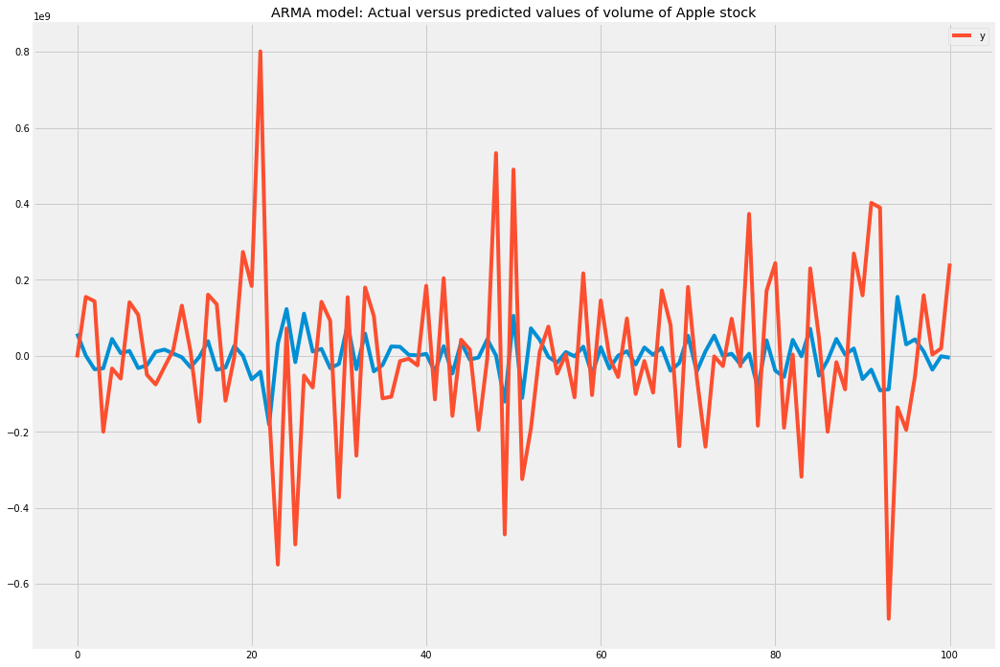

In [89]:
# Predicting Volume of Apple
volume = ARMA(apple["Volume"].diff().iloc[1:].values, order=(1,0))
res = volume.fit()
res.plot_predict(start=1000, end=1100)
_ = plt.title('ARMA model: Actual versus predicted values of volume of Apple stock')
plt.show()

In [90]:
rmse = math.sqrt(mean_squared_error(apple["Volume"].diff().iloc[900:1000].values, result.predict(start=900,end=999)))
print("The root mean squared error is {}.".format(rmse))

The root mean squared error is 155393298.3070032.


There are always better models.

## <a id='4.2'>4.2 MA models</a>


## Simulating MA(1) model

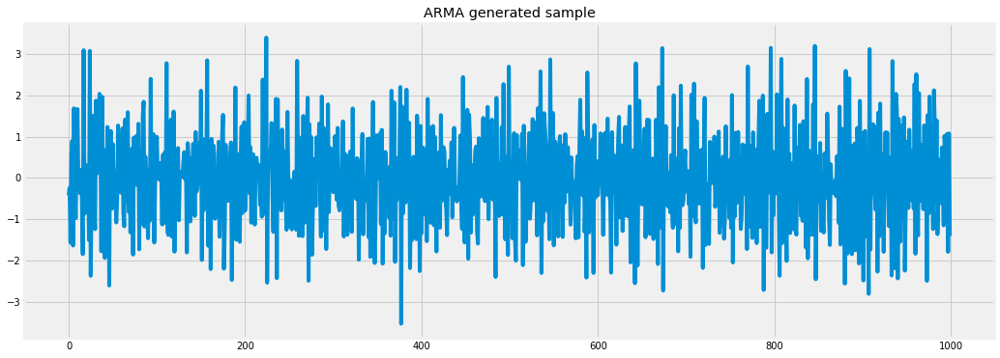

In [91]:
rcParams['figure.figsize'] = 16, 6
ar1 = np.array([1])
ma1 = np.array([1, -0.5])
MA1 = ArmaProcess(ar1, ma1)
sim1 = MA1.generate_sample(nsample=1000)
_ = plt.title('ARMA generated sample')
plt.plot(sim1)

## Forecasting the simulated MA model

In [92]:
model = ARMA(sim1, order=(0,1))
result = model.fit()
print(result.summary())
print("μ={} ,θ={}".format(result.params[0],result.params[1]))

                              ARMA Model Results                              
Dep. Variable:                      y   No. Observations:                 1000
Model:                     ARMA(0, 1)   Log Likelihood               -1423.276
Method:                       css-mle   S.D. of innovations              1.004
Date:                Sat, 09 Dec 2023   AIC                           2852.553
Time:                        00:08:13   BIC                           2867.276
Sample:                             0   HQIC                          2858.148
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0228      0.014     -1.652      0.099      -0.050       0.004
ma.L1.y       -0.5650      0.027    -20.797      0.000      -0.618      -0.512
                                    Roots           

## Prediction using MA models

                              ARMA Model Results                              
Dep. Variable:                      y   No. Observations:                 4514
Model:                     ARMA(0, 3)   Log Likelihood               -5453.678
Method:                       css-mle   S.D. of innovations              0.810
Date:                Sat, 09 Dec 2023   AIC                          10917.357
Time:                        00:08:13   BIC                          10949.432
Sample:                             0   HQIC                         10928.657
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0229      0.011      1.998      0.046       0.000       0.045
ma.L1.y       -0.0387      0.015     -2.598      0.009      -0.068      -0.010
ma.L2.y       -0.0190      0.015     -1.310      0.1

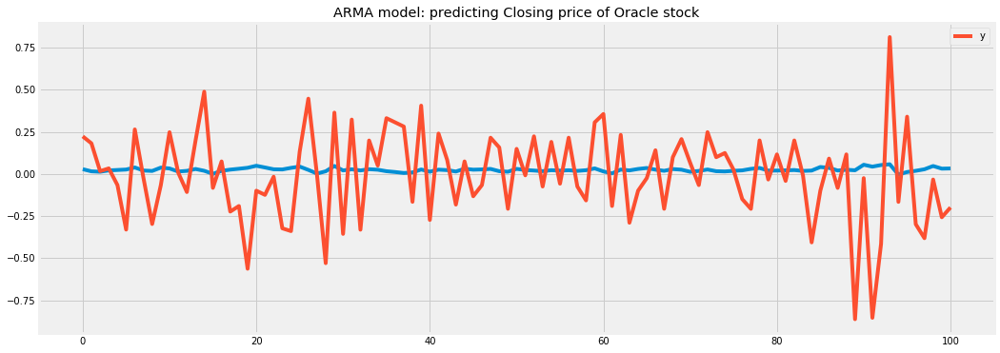

In [93]:
# Forecasting and predicting Closing price of Oracle
model = ARMA(oracle["Close"].diff().iloc[1:].values, order=(0,3))
result = model.fit()
print(result.summary())
print("μ={} ,θ={}".format(result.params[0],result.params[1]))
result.plot_predict(start=1000, end=1100)
_ = plt.title('ARMA model: predicting Closing price of Oracle stock')
plt.show()

In [94]:
rmse = math.sqrt(mean_squared_error(oracle["Close"].diff().iloc[1000:1101].values, result.predict(start=1000,end=1100)))
print("The root mean squared error is {}.".format(rmse))

The root mean squared error is 0.2763226339916208.


                              ARMA Model Results                              
Dep. Variable:                      y   No. Observations:                 4514
Model:                     ARMA(0, 3)   Log Likelihood              -79324.766
Method:                       css-mle   S.D. of innovations       10365197.209
Date:                Sat, 09 Dec 2023   AIC                         158659.531
Time:                        00:08:15   BIC                         158691.606
Sample:                             0   HQIC                        158670.831
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1.071e+04   1.69e+04     -0.636      0.525   -4.37e+04    2.23e+04
ma.L1.y       -0.5476      0.015    -36.853      0.000      -0.577      -0.518
ma.L2.y       -0.2242      0.018    -12.542      0.0

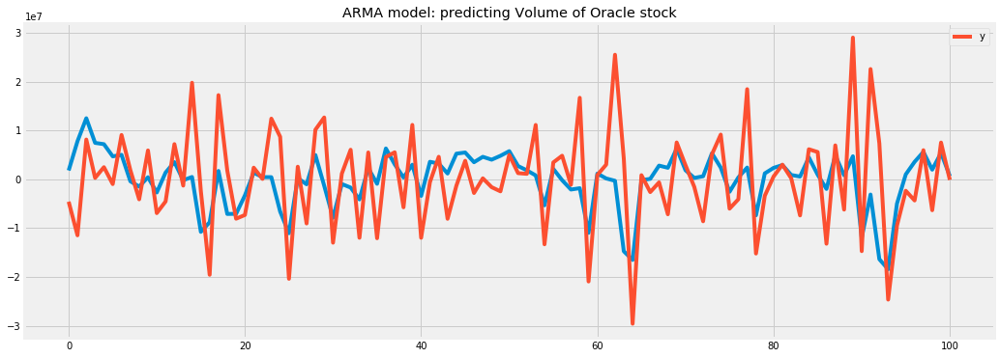

In [95]:
# Forecasting and predicting Volume of Oracle
model = ARMA(oracle["Volume"].diff().iloc[1:].values, order=(0,3))
result = model.fit()
print(result.summary())
print("μ={} ,θ={}".format(result.params[0],result.params[1]))
result.plot_predict(start=1000, end=1100)
_ = plt.title('ARMA model: predicting Volume of Oracle stock')
plt.show()

In [96]:
rmse = math.sqrt(mean_squared_error(oracle["Volume"].diff().iloc[1000:1101].values, result.predict(start=1000,end=1100)))
print("The root mean squared error is {}.".format(rmse))

The root mean squared error is 13773993.914912418.


                              ARMA Model Results                              
Dep. Variable:                      y   No. Observations:                 4514
Model:                     ARMA(0, 3)   Log Likelihood               -7507.450
Method:                       css-mle   S.D. of innovations              1.277
Date:                Sat, 09 Dec 2023   AIC                          15024.900
Time:                        00:08:17   BIC                          15056.975
Sample:                             0   HQIC                         15036.200
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0428      0.018      2.428      0.015       0.008       0.077
ma.L1.y       -0.0374      0.015     -2.513      0.012      -0.067      -0.008
ma.L2.y       -0.0221      0.015     -1.480      0.1

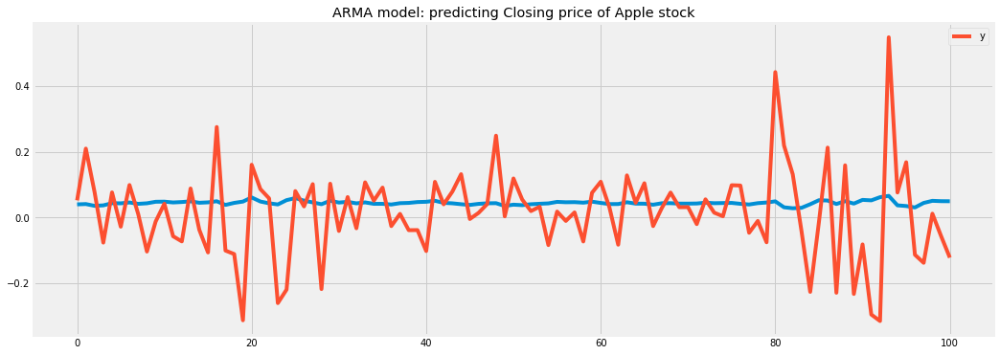

In [97]:
# Forecasting and predicting Closing price of Apple
model = ARMA(apple["Close"].diff().iloc[1:].values, order=(0,3))
result = model.fit()
print(result.summary())
print("μ={} ,θ={}".format(result.params[0],result.params[1]))
result.plot_predict(start=1000, end=1100)
_ = plt.title('ARMA model: predicting Closing price of Apple stock')
plt.show()

In [98]:
rmse = math.sqrt(mean_squared_error(apple["Close"].diff().iloc[1000:1101].values, result.predict(start=1000,end=1100)))
print("The root mean squared error is {}.".format(rmse))

The root mean squared error is 0.14299329681152792.


                              ARMA Model Results                              
Dep. Variable:                      y   No. Observations:                 4514
Model:                     ARMA(0, 3)   Log Likelihood              -91780.135
Method:                       css-mle   S.D. of innovations      163659435.864
Date:                Sat, 09 Dec 2023   AIC                         183570.269
Time:                        00:08:18   BIC                         183602.344
Sample:                             0   HQIC                        183581.569
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1.678e+05   4.93e+05     -0.340      0.734   -1.13e+06    7.99e+05
ma.L1.y       -0.4133      0.015    -28.068      0.000      -0.442      -0.384
ma.L2.y       -0.2618      0.016    -16.384      0.0

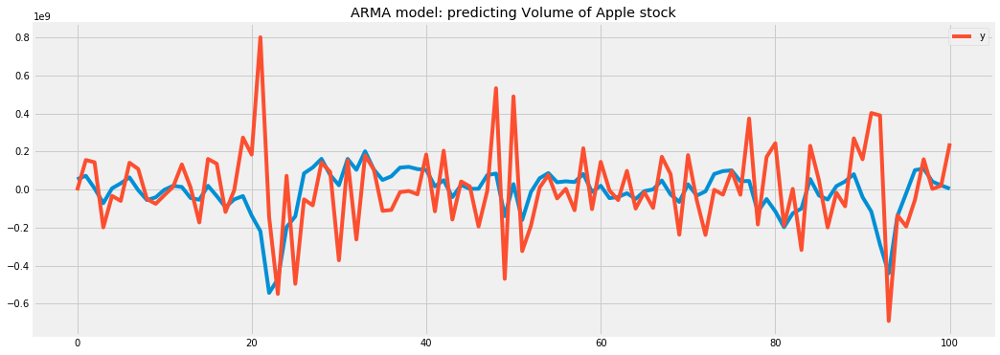

In [99]:
# Forecasting and predicting Volume of Apple
model = ARMA(apple["Volume"].diff().iloc[1:].values, order=(0,3))
result = model.fit()
print(result.summary())
print("μ={} ,θ={}".format(result.params[0],result.params[1]))
result.plot_predict(start=1000, end=1100)
_ = plt.title('ARMA model: predicting Volume of Apple stock')
plt.show()

In [100]:
rmse = math.sqrt(mean_squared_error(apple["Volume"].diff().iloc[1000:1101].values, result.predict(start=1000,end=1100)))
print("The root mean squared error is {}.".format(rmse))

The root mean squared error is 292383261.67045057.


## <a id='4.3'>4.3 ARMA models</a>


## Prediction using ARMA models
I am not simulating any model because it's quite similar to AR and MA models. Just  forecasting and predictions for this one.

                              ARMA Model Results                              
Dep. Variable:                      y   No. Observations:                 4514
Model:                     ARMA(3, 3)   Log Likelihood               -5438.600
Method:                       css-mle   S.D. of innovations              0.807
Date:                Sat, 09 Dec 2023   AIC                          10893.200
Time:                        00:08:25   BIC                          10944.520
Sample:                             0   HQIC                         10911.281
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0229      0.011      2.014      0.044       0.001       0.045
ar.L1.y       -1.2182      0.138     -8.848      0.000      -1.488      -0.948
ar.L2.y       -0.9088      0.176     -5.163      0.0

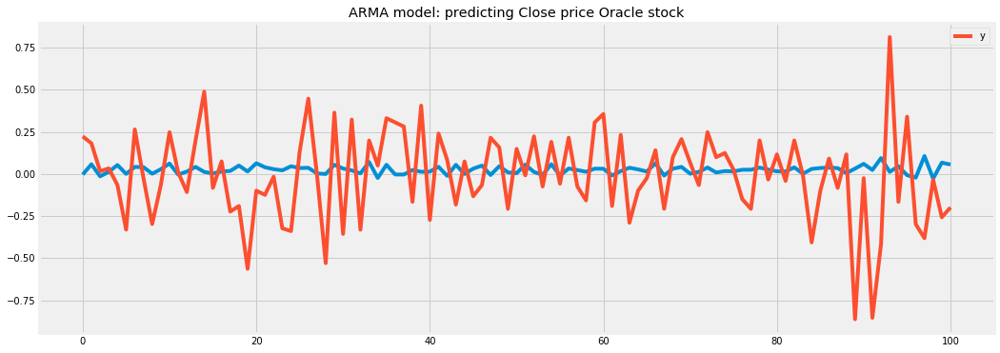

In [101]:
# Forecasting and predicting Closing price of Oracle stock 
model = ARMA(oracle["Close"].diff().iloc[1:].values, order=(3,3))
result = model.fit()
print(result.summary())
print("μ={}, ϕ={}, θ={}".format(result.params[0],result.params[1],result.params[2]))
result.plot_predict(start=1000, end=1100)
_ = plt.title('ARMA model: predicting Close price Oracle stock')
plt.show()

In [102]:
rmse = math.sqrt(mean_squared_error(oracle["Close"].diff().iloc[1000:1101].values, result.predict(start=1000,end=1100)))
print("The root mean squared error is {}.".format(rmse))

The root mean squared error is 0.27786372412630916.


                              ARMA Model Results                              
Dep. Variable:                      y   No. Observations:                 4514
Model:                     ARMA(3, 3)   Log Likelihood              -79272.437
Method:                       css-mle   S.D. of innovations       10244596.261
Date:                Sat, 09 Dec 2023   AIC                         158560.874
Time:                        00:08:33   BIC                         158612.194
Sample:                             0   HQIC                        158578.955
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1.071e+04   4316.498     -2.481      0.013   -1.92e+04   -2250.159
ar.L1.y        0.7350      0.296      2.479      0.013       0.154       1.316
ar.L2.y        0.2261      0.366      0.618      0.5

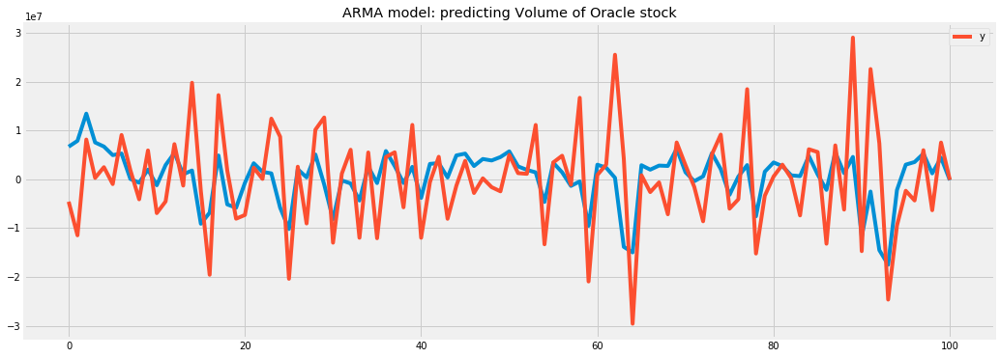

In [103]:
# Forecasting and predicting Oracle stock volume
model = ARMA(oracle["Volume"].diff().iloc[1:].values, order=(3,3))
result = model.fit()
print(result.summary())
print("μ={}, ϕ={}, θ={}".format(result.params[0],result.params[1],result.params[2]))
result.plot_predict(start=1000, end=1100)
_ = plt.title('ARMA model: predicting Volume of Oracle stock')
plt.show()

In [104]:
rmse = math.sqrt(mean_squared_error(oracle["Volume"].diff().iloc[1000:1101].values, result.predict(start=1000,end=1100)))
print("The root mean squared error is {}.".format(rmse))

The root mean squared error is 13866914.31830184.


/opt/conda/lib/python3.6/site-packages/statsmodels/base/model.py:496: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                              ARMA Model Results                              
Dep. Variable:                      y   No. Observations:                 4514
Model:                     ARMA(3, 3)   Log Likelihood              -91759.238
Method:                       css-mle   S.D. of innovations      162843388.929
Date:                Sat, 09 Dec 2023   AIC                         183534.476
Time:                        00:08:43   BIC                         183585.796
Sample:                             0   HQIC                        183552.556
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1.678e+05   1.04e+05     -1.607      0.108   -3.73e+05    3.69e+04
ar.L1.y        0.4127      0.029     14.442      0.000       0.357       0.469
ar.L2.y        0.9700      0.007    132.996      0.0

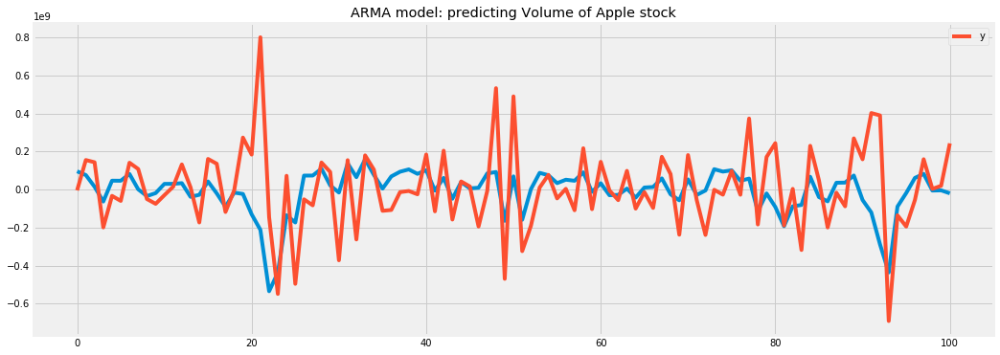

In [105]:
# Forecasting and predicting Apple stock volume
model = ARMA(apple["Volume"].diff().iloc[1:].values, order=(3,3))
result = model.fit()
print(result.summary())
print("μ={}, ϕ={}, θ={}".format(result.params[0],result.params[1],result.params[2]))
result.plot_predict(start=1000, end=1100)
_ = plt.title('ARMA model: predicting Volume of Apple stock')
plt.show()

In [106]:
rmse = math.sqrt(mean_squared_error(apple["Volume"].diff().iloc[1000:1101].values, result.predict(start=1000,end=1100)))
print("The root mean squared error is {}.".format(rmse))

The root mean squared error is 295491759.4706605.


ARMA model shows much better results than AR and MA models.

## <a id='4.4'>4.4 ARIMA models</a>


## Prediction using ARIMA model

                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                 4513
Model:                 ARIMA(2, 1, 0)   Log Likelihood               -6128.128
Method:                       css-mle   S.D. of innovations              0.941
Date:                Sat, 09 Dec 2023   AIC                          12264.255
Time:                        00:08:46   BIC                          12289.914
Sample:                             1   HQIC                         12273.295
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.425e-05      0.007      0.004      0.997      -0.013       0.013
ar.L1.D.y     -0.6882      0.014    -49.433      0.000      -0.716      -0.661
ar.L2.D.y     -0.3546      0.014    -25.449      0.0

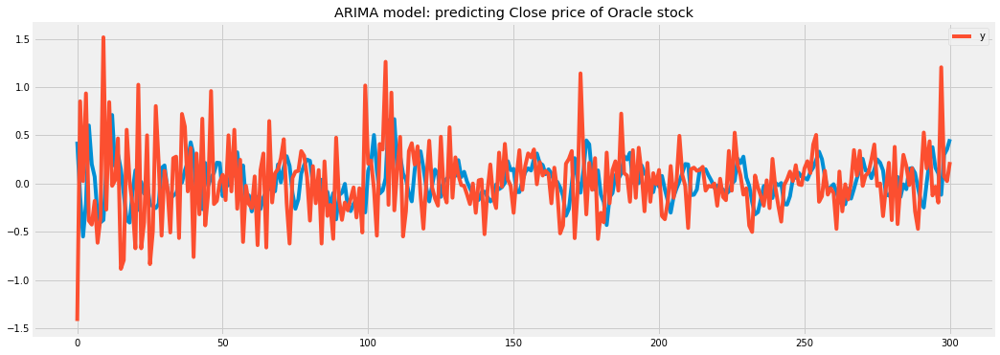

In [107]:
# Predicting the close price of Oracle stock 
rcParams['figure.figsize'] = 16, 6
model = ARIMA(oracle["Close"].diff().iloc[1:].values, order=(2,1,0))
result = model.fit()
print(result.summary())
result.plot_predict(start=700, end=1000)
_ = plt.title('ARIMA model: predicting Close price of Oracle stock')
plt.show()

In [108]:
rmse = math.sqrt(mean_squared_error(oracle["Close"].diff().iloc[700:1001].values, result.predict(start=700,end=1000)))
print("The root mean squared error is {}.".format(rmse))

The root mean squared error is 0.7025052427629827.


                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                 4513
Model:                 ARIMA(2, 1, 0)   Log Likelihood              -80724.519
Method:                       css-mle   S.D. of innovations       14190402.334
Date:                Sat, 09 Dec 2023   AIC                         161457.037
Time:                        00:08:47   BIC                         161482.696
Sample:                             1   HQIC                        161466.077
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        136.4986   9.29e+04      0.001      0.999   -1.82e+05    1.82e+05
ar.L1.D.y     -0.8314      0.013    -62.284      0.000      -0.858      -0.805
ar.L2.D.y     -0.4430      0.013    -33.173      0.0

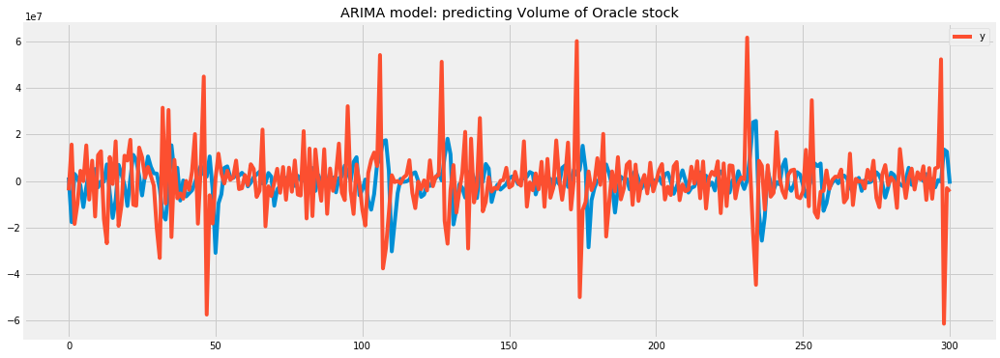

In [109]:
# Predicting the Oracle stock volume
rcParams['figure.figsize'] = 16, 6
model = ARIMA(oracle["Volume"].diff().iloc[1:].values, order=(2,1,0))
result = model.fit()
print(result.summary())
result.plot_predict(start=700, end=1000)
_ = plt.title('ARIMA model: predicting Volume of Oracle stock')
plt.show()

In [110]:
rmse = math.sqrt(mean_squared_error(oracle["Volume"].diff().iloc[700:1001].values, result.predict(start=700,end=1000)))
print("The root mean squared error is {}.".format(rmse))

The root mean squared error is 29301558.9072669.


                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                 4513
Model:                 ARIMA(2, 1, 0)   Log Likelihood               -8204.721
Method:                       css-mle   S.D. of innovations              1.490
Date:                Sat, 09 Dec 2023   AIC                          16417.442
Time:                        00:08:48   BIC                          16443.101
Sample:                             1   HQIC                         16426.482
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0003      0.011      0.024      0.981      -0.021       0.022
ar.L1.D.y     -0.6799      0.014    -48.612      0.000      -0.707      -0.653
ar.L2.D.y     -0.3420      0.014    -24.451      0.0

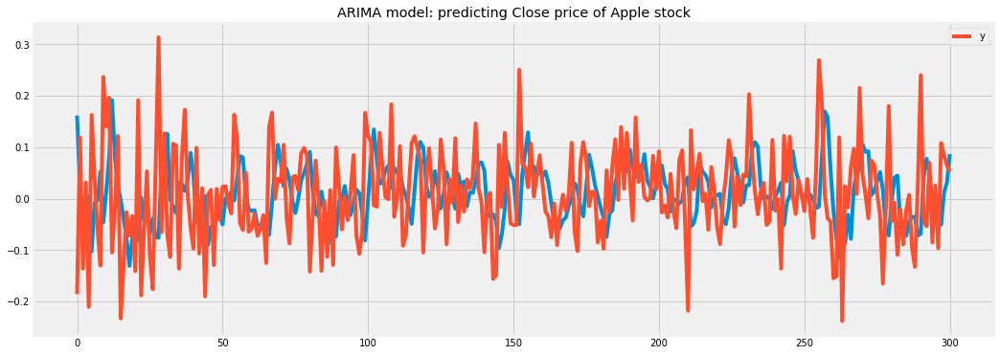

In [111]:
# Predicting the Close price of Apple stocks 
rcParams['figure.figsize'] = 16, 6
model = ARIMA(apple["Close"].diff().iloc[1:].values, order=(2,1,0))
result = model.fit()
print(result.summary())
result.plot_predict(start=700, end=1000)
_ = plt.title('ARIMA model: predicting Close price of Apple stock')
plt.show()

In [112]:
rmse = math.sqrt(mean_squared_error(apple["Close"].diff().iloc[700:1001].values, result.predict(start=700,end=1000)))
print("The root mean squared error is {}.".format(rmse))

The root mean squared error is 0.16642517723114753.


                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                 4513
Model:                 ARIMA(2, 1, 0)   Log Likelihood              -93184.992
Method:                       css-mle   S.D. of innovations      224439189.788
Date:                Sat, 09 Dec 2023   AIC                         186377.984
Time:                        00:08:49   BIC                         186403.643
Sample:                             1   HQIC                        186387.024
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       4.206e+04   1.58e+06      0.027      0.979   -3.05e+06    3.14e+06
ar.L1.D.y     -0.7252      0.014    -52.945      0.000      -0.752      -0.698
ar.L2.D.y     -0.3914      0.014    -28.571      0.0

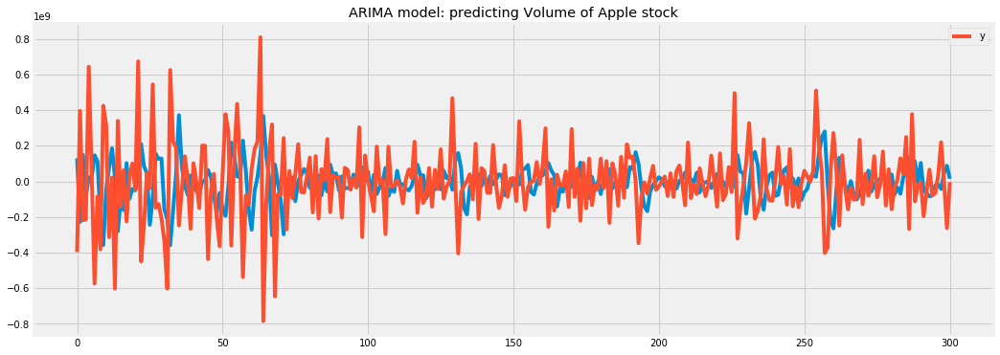

In [113]:
# Predicting the Apple stocks volume
rcParams['figure.figsize'] = 16, 6
model = ARIMA(apple["Volume"].diff().iloc[1:].values, order=(2,1,0))
result = model.fit()
print(result.summary())
result.plot_predict(start=700, end=1000)
_ = plt.title('ARIMA model: predicting Volume of Apple stock')
plt.show()

In [114]:
rmse = math.sqrt(mean_squared_error(apple["Volume"].diff().iloc[700:1001].values, result.predict(start=700,end=1000)))
print("The root mean squared error is {}.".format(rmse))

The root mean squared error is 393942886.1188498.


Taking the slight lag into account, this is a fine model.

## <a id='4.5'>4.5 VAR models</a>


                           Statespace Model Results                           
Dep. Variable:     ['Close', 'Close']   No. Observations:                 4515
Model:                     VARMA(2,1)   Log Likelihood              -12503.012
                          + intercept   AIC                          25040.023
Date:                Sat, 09 Dec 2023   BIC                          25149.081
Time:                        00:10:53   HQIC                         25078.445
Sample:                    01-04-2006                                         
                         - 12-08-2023                                         
Covariance Type:                  opg                                         
Ljung-Box (Q):                    nan, nan   Jarque-Bera (JB):   557898.63, 43753.58
Prob(Q):                          nan, nan   Prob(JB):                    0.00, 0.00
Heteroskedasticity (H):      12.06, 280.63   Skew:                       -1.19, 0.03
Prob(H) (two-sided):            0.

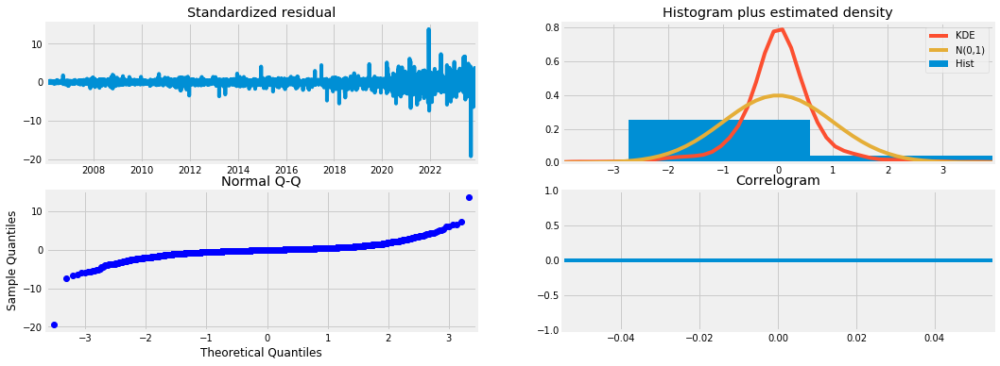

In [115]:
# Predicting closing price of Oracle and Apple
train_sample = pd.concat([oracle["Close"].diff().iloc[1:], apple["Close"].diff().iloc[1:]],axis=1)
model = sm.tsa.VARMAX(train_sample,order=(2,1),trend='c')
result = model.fit(maxiter=1000,disp=False)
print(result.summary())
predicted_result = result.predict(start=0, end=1000)
result.plot_diagnostics()
# calculating error
rmse = math.sqrt(mean_squared_error(train_sample.iloc[1:1002].values, predicted_result.values))
print("The root mean squared error is {}.".format(rmse))

                            Statespace Model Results                            
Dep. Variable:     ['Volume', 'Volume']   No. Observations:                 4515
Model:                       VARMA(2,1)   Log Likelihood             -171010.759
                            + intercept   AIC                         342055.519
Date:                  Sat, 09 Dec 2023   BIC                         342164.577
Time:                          00:12:04   HQIC                        342093.940
Sample:                      01-04-2006                                         
                           - 12-08-2023                                         
Covariance Type:                    opg                                         
Ljung-Box (Q):                    nan, nan   Jarque-Bera (JB):   156192.89, 144324.26
Prob(Q):                          nan, nan   Prob(JB):                     0.00, 0.00
Heteroskedasticity (H):         0.02, 0.02   Skew:                        -2.77, 2.91
Prob(H) (two-

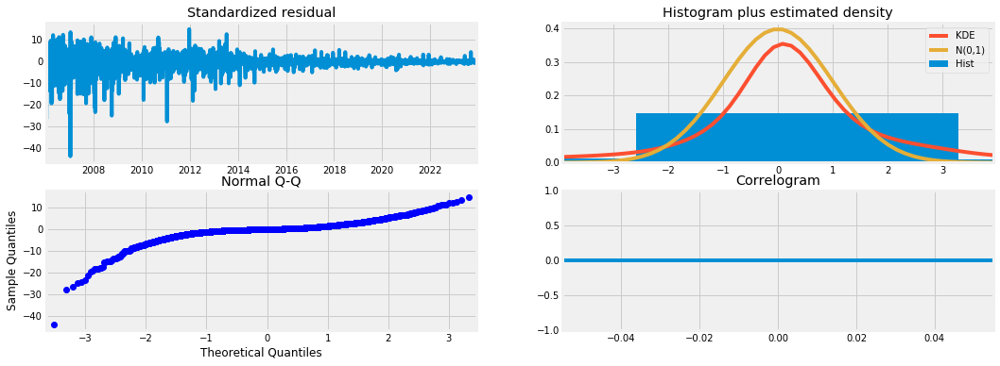

In [116]:
# Predicting Volume of Oracle and Apple
train_sample = pd.concat([oracle["Volume"].diff().iloc[1:], apple["Volume"].diff().iloc[1:]],axis=1)
model = sm.tsa.VARMAX(train_sample,order=(2,1),trend='c')
result = model.fit(maxiter=1000,disp=False)
print(result.summary())
predicted_result = result.predict(start=0, end=1000)
result.plot_diagnostics()
# calculating error
rmse = math.sqrt(mean_squared_error(train_sample.iloc[1:1002].values, predicted_result.values))
print("The root mean squared error is {}.".format(rmse))

## <a id='4.6'>4.6 State Space methods</a>


## <a id='4.6.1'>4.6.1 SARIMA models</a>
SARIMA models are useful for modeling seasonal time series, in which the mean and other statistics for a given season are not stationary across the years. The SARIMA model defined constitutes a straightforward extension of the nonseasonal autoregressive-moving average (ARMA) and autoregressive integrated moving average (ARIMA) models presented

                           Statespace Model Results                           
Dep. Variable:                      y   No. Observations:                 4514
Model:               SARIMAX(4, 0, 4)   Log Likelihood               -5424.197
Date:                Sat, 09 Dec 2023   AIC                          10868.394
Time:                        00:12:19   BIC                          10932.544
Sample:                             0   HQIC                         10890.995
                               - 4514                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.1860      0.101      1.838      0.066      -0.012       0.384
ar.L1         -2.3578      0.071    -33.151      0.000      -2.497      -2.218
ar.L2         -2.6470      0.158    -16.755      0.0

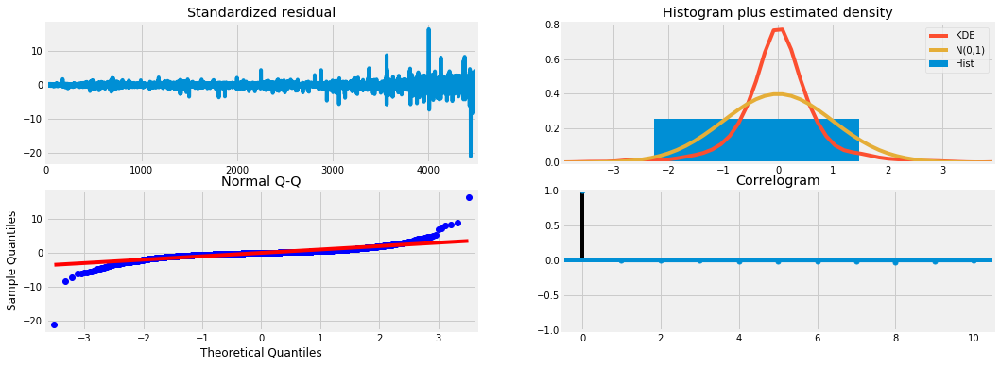

In [117]:
# Predicting closing price of Oracle'
train_sample = oracle["Close"].diff().iloc[1:].values

model = sm.tsa.SARIMAX(train_sample,order=(4,0,4),trend='c', enforce_invertibility=False, enforce_stationarity=False)
result = model.fit(maxiter=1000, disp=False)
print(result.summary())
predicted_result = result.predict(start=0, end=500)
result.plot_diagnostics()
# calculating error
rmse = math.sqrt(mean_squared_error(train_sample[1:502], predicted_result))
print("The root mean squared error is {}.".format(rmse))

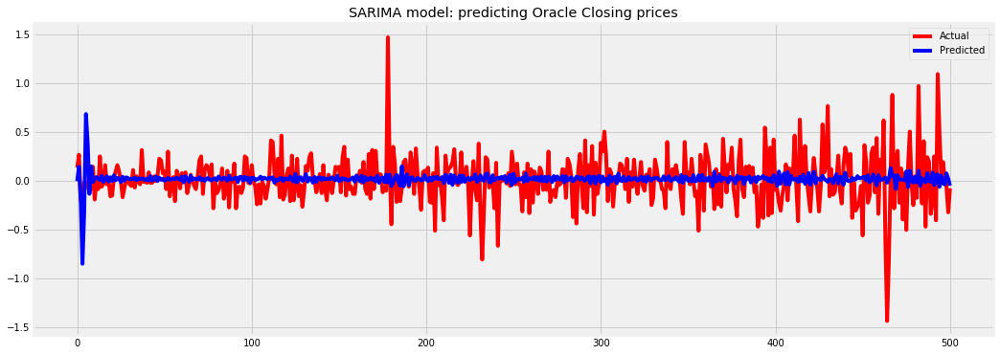

In [118]:
plt.plot(train_sample[1:502],color='red')
plt.plot(predicted_result,color='blue')
plt.legend(['Actual','Predicted'])
plt.title('SARIMA model: predicting Oracle Closing prices')
plt.show()

                           Statespace Model Results                           
Dep. Variable:                      y   No. Observations:                 4514
Model:               SARIMAX(4, 0, 4)   Log Likelihood              -79510.335
Date:                Sat, 09 Dec 2023   AIC                         159040.671
Time:                        00:12:34   BIC                         159104.820
Sample:                             0   HQIC                        159063.271
                               - 4514                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept  -3.484e+04   3.75e-06  -9.29e+09      0.000   -3.48e+04   -3.48e+04
ar.L1         -0.3222      0.212     -1.523      0.128      -0.737       0.093
ar.L2          0.0839      0.207      0.405      0.6

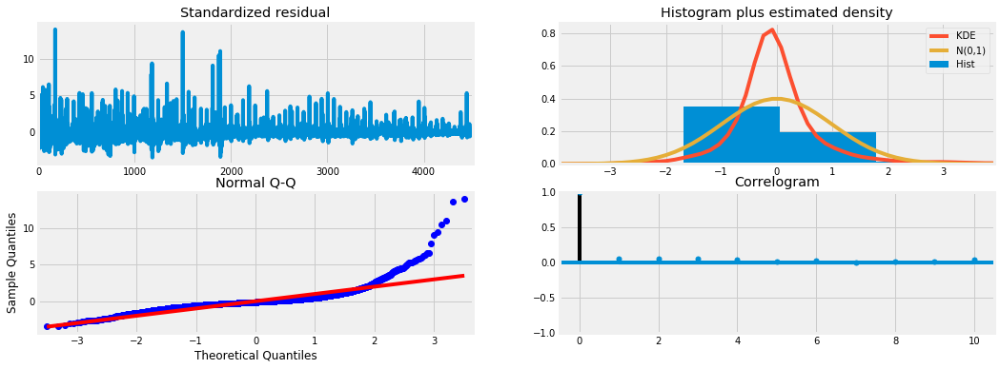

In [119]:
# Predicting Volume of Oracle'
train_sample = oracle["Volume"].diff().iloc[1:].values

model = sm.tsa.SARIMAX(train_sample,order=(4,0,4),trend='c', enforce_invertibility=False, enforce_stationarity=False)
result = model.fit(maxiter=1000, disp=False)
print(result.summary())
predicted_result = result.predict(start=0, end=500)
result.plot_diagnostics()
# calculating error
rmse = math.sqrt(mean_squared_error(train_sample[1:502], predicted_result))
print("The root mean squared error is {}.".format(rmse))

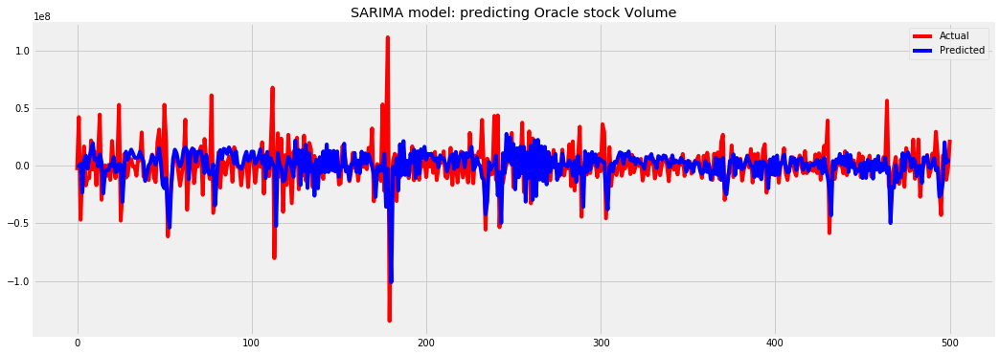

In [120]:
plt.plot(train_sample[1:502],color='red')
plt.plot(predicted_result,color='blue')
plt.legend(['Actual','Predicted'])
plt.title('SARIMA model: predicting Oracle stock Volume')
plt.show()

                           Statespace Model Results                           
Dep. Variable:                      y   No. Observations:                 4514
Model:               SARIMAX(4, 0, 4)   Log Likelihood               -7485.887
Date:                Sat, 09 Dec 2023   AIC                          14991.775
Time:                        00:12:46   BIC                          15055.924
Sample:                             0   HQIC                         15014.375
                               - 4514                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.1614      0.069      2.333      0.020       0.026       0.297
ar.L1         -1.1006      0.087    -12.718      0.000      -1.270      -0.931
ar.L2         -0.5858      0.131     -4.463      0.0

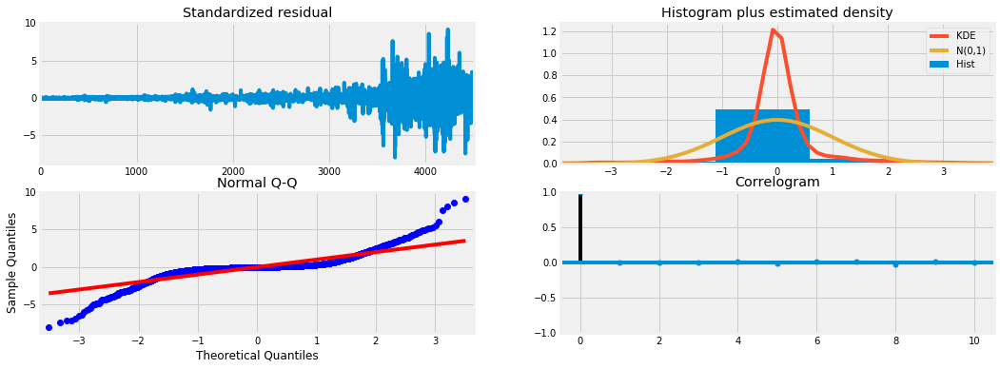

In [121]:
train_sample = apple["Close"].diff().iloc[1:].values
model = sm.tsa.SARIMAX(train_sample,order=(4,0,4),trend='c', enforce_invertibility=False, enforce_stationarity=False)
result = model.fit(maxiter=1000,disp=False)
print(result.summary())
predicted_result = result.predict(start=0, end=500)
result.plot_diagnostics()
# calculating error
rmse = math.sqrt(mean_squared_error(train_sample[1:502], predicted_result))
print("The root mean squared error is {}.".format(rmse))

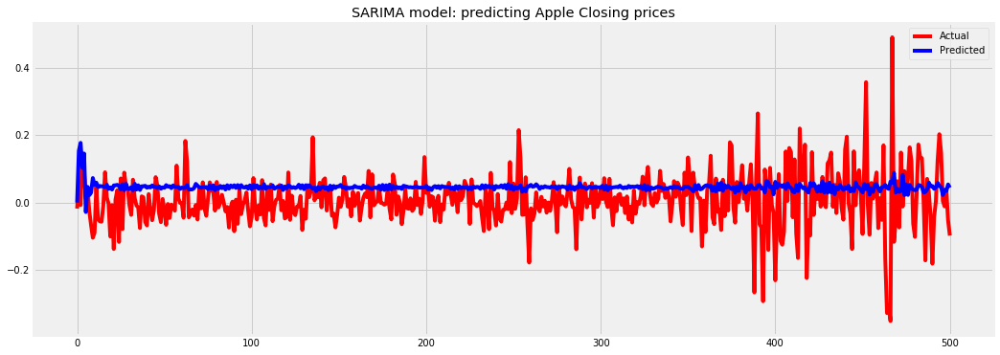

In [122]:
plt.plot(train_sample[1:502],color='red')
plt.plot(predicted_result,color='blue')
plt.legend(['Actual','Predicted'])
plt.title('SARIMA model: predicting Apple Closing prices')
plt.show()

                           Statespace Model Results                           
Dep. Variable:                      y   No. Observations:                 4514
Model:               SARIMAX(4, 0, 4)   Log Likelihood              -91622.146
Date:                Sat, 09 Dec 2023   AIC                         183264.292
Time:                        00:12:55   BIC                         183328.442
Sample:                             0   HQIC                        183286.893
                               - 4514                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept  -8.393e+05   3.76e-07  -2.23e+12      0.000   -8.39e+05   -8.39e+05
ar.L1          0.4460      0.235      1.898      0.058      -0.015       0.907
ar.L2          0.0200      0.303      0.066      0.9

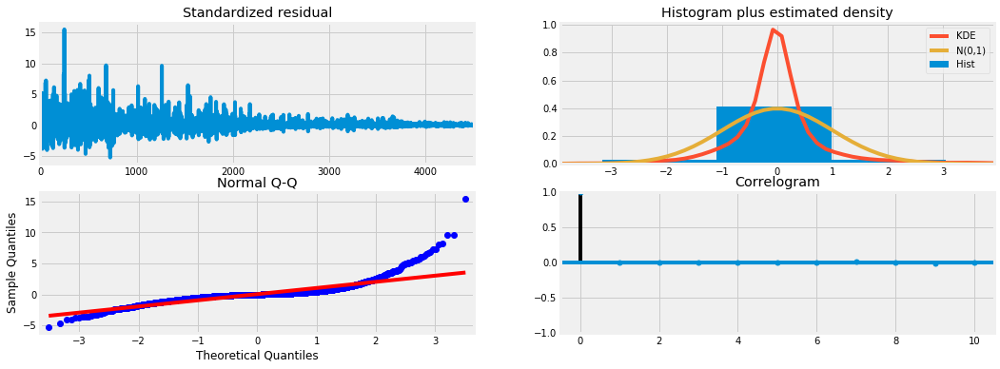

In [123]:
train_sample = apple["Volume"].diff().iloc[1:].values
model = sm.tsa.SARIMAX(train_sample,order=(4,0,4),trend='c', enforce_invertibility=False, enforce_stationarity=False)
result = model.fit(maxiter=1000,disp=False)
print(result.summary())
predicted_result = result.predict(start=0, end=500)
result.plot_diagnostics()
# calculating error
rmse = math.sqrt(mean_squared_error(train_sample[1:502], predicted_result))
print("The root mean squared error is {}.".format(rmse))

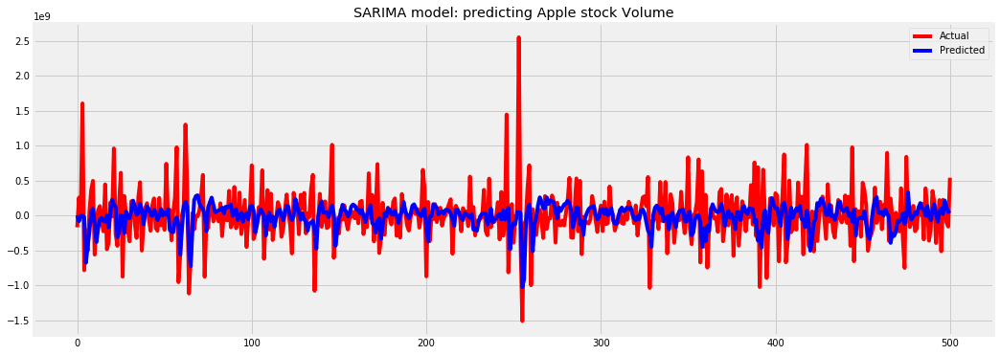

In [124]:
plt.plot(train_sample[1:502],color='red')
plt.plot(predicted_result,color='blue')
plt.legend(['Actual','Predicted'])
plt.title('SARIMA model: predicting Apple stock Volume')
plt.show()

## <a id='4.6.2'>4.6.2 Unobserved components</a>
A UCM decomposes the response series into components such as trend, seasons, cycles, and the regression effects due to predictor series

                        Unobserved Components Results                         
Dep. Variable:                      y   No. Observations:                 4514
Model:                    local level   Log Likelihood               -5461.454
Date:                Sat, 09 Dec 2023   AIC                          10926.908
Time:                        00:12:58   BIC                          10939.738
Sample:                             0   HQIC                         10931.428
                               - 4514                                         
Covariance Type:                  opg                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
sigma2.irregular     0.6573      0.002    273.985      0.000       0.653       0.662
sigma2.level      1.198e-07   3.27e-07      0.367      0.714   -5.21e-07     7.6e-07
Ljung-Box (Q):              

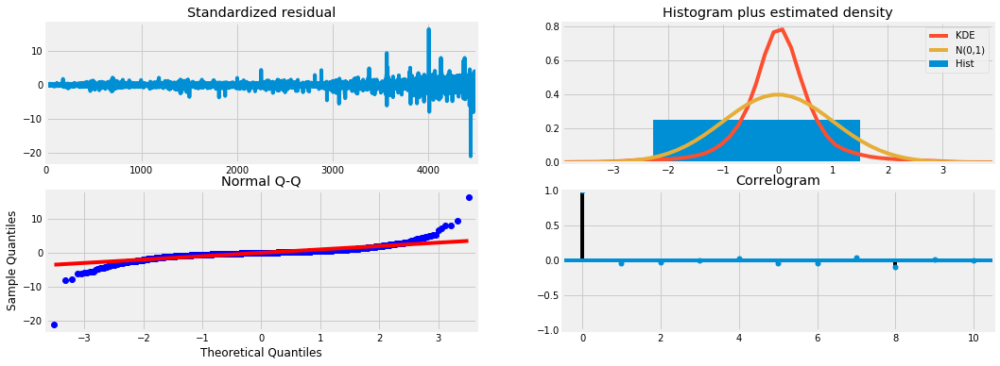

In [125]:
# Predicting closing price of Oracle'
train_sample = oracle["Close"].diff().iloc[1:].values
model = sm.tsa.UnobservedComponents(train_sample,'local level')
result = model.fit(maxiter=1000,disp=False)
print(result.summary())
predicted_result = result.predict(start=0, end=500)
result.plot_diagnostics()
# calculating error
rmse = math.sqrt(mean_squared_error(train_sample[1:502], predicted_result))
print("The root mean squared error is {}.".format(rmse))

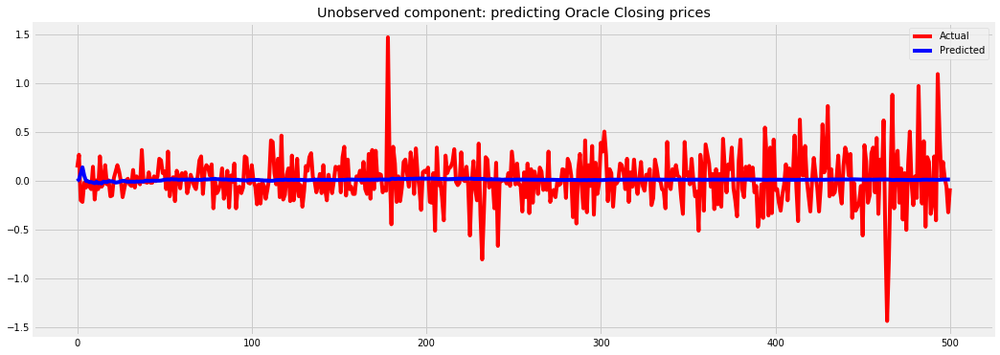

In [126]:
plt.plot(train_sample[1:502],color='red')
plt.plot(predicted_result,color='blue')
plt.legend(['Actual','Predicted'])
plt.title('Unobserved component: predicting Oracle Closing prices')
plt.show()

                        Unobserved Components Results                         
Dep. Variable:                      y   No. Observations:                 4514
Model:                    local level   Log Likelihood              -80016.858
Date:                Sat, 09 Dec 2023   AIC                         160037.717
Time:                        00:13:01   BIC                         160050.546
Sample:                             0   HQIC                        160042.237
                               - 4514                                         
Covariance Type:                  opg                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
sigma2.irregular  1.415e+14   7.58e+11    186.502      0.000     1.4e+14    1.43e+14
sigma2.level       1.82e+11   4.33e+10      4.200      0.000    9.71e+10    2.67e+11
Ljung-Box (Q):              

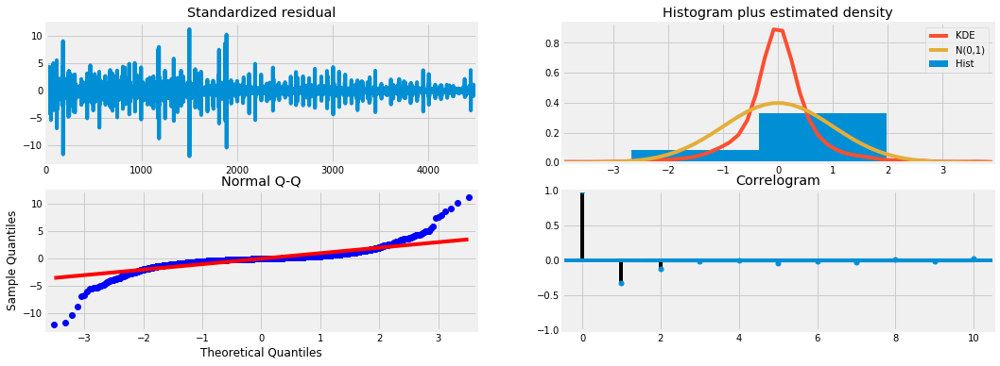

In [127]:
# Predicting Volume of Oracle'
train_sample = oracle["Volume"].diff().iloc[1:].values
model = sm.tsa.UnobservedComponents(train_sample,'local level')
result = model.fit(maxiter=1000,disp=False)
print(result.summary())
predicted_result = result.predict(start=0, end=500)
result.plot_diagnostics()
# calculating error
rmse = math.sqrt(mean_squared_error(train_sample[1:502], predicted_result))
print("The root mean squared error is {}.".format(rmse))

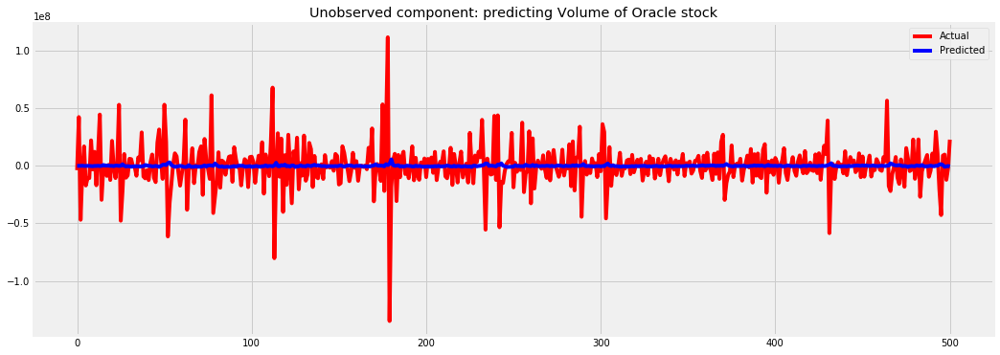

In [128]:
plt.plot(train_sample[1:502],color='red')
plt.plot(predicted_result,color='blue')
plt.legend(['Actual','Predicted'])
plt.title('Unobserved component: predicting Volume of Oracle stock')
plt.show()

                        Unobserved Components Results                         
Dep. Variable:                      y   No. Observations:                 4514
Model:                    local level   Log Likelihood               -7514.429
Date:                Sat, 09 Dec 2023   AIC                          15032.858
Time:                        00:13:04   BIC                          15045.688
Sample:                             0   HQIC                         15037.378
                               - 4514                                         
Covariance Type:                  opg                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
sigma2.irregular     1.6322      0.012    140.338      0.000       1.609       1.655
sigma2.level      1.316e-06   1.33e-06      0.992      0.321   -1.28e-06    3.92e-06
Ljung-Box (Q):              

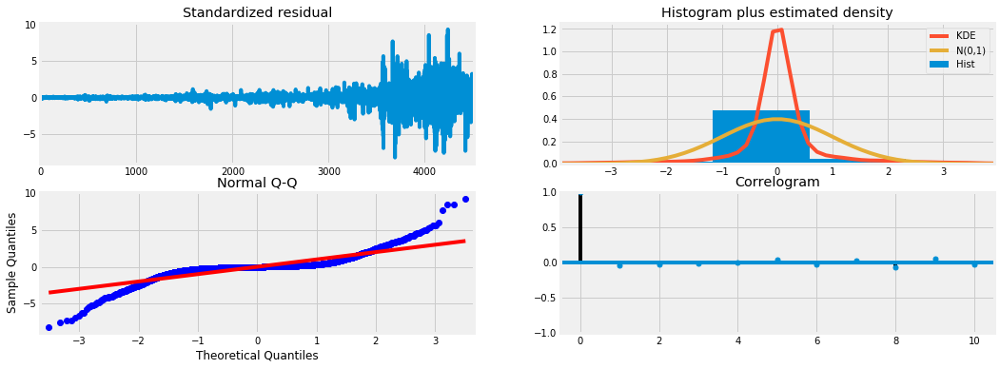

In [129]:
# Predicting closing price of Apple'
train_sample = apple["Close"].diff().iloc[1:].values
model = sm.tsa.UnobservedComponents(train_sample,'local level')
result = model.fit(maxiter=1000,disp=False)
print(result.summary())
predicted_result = result.predict(start=0, end=500)
result.plot_diagnostics()
# calculating error
rmse = math.sqrt(mean_squared_error(train_sample[1:502], predicted_result))
print("The root mean squared error is {}.".format(rmse))

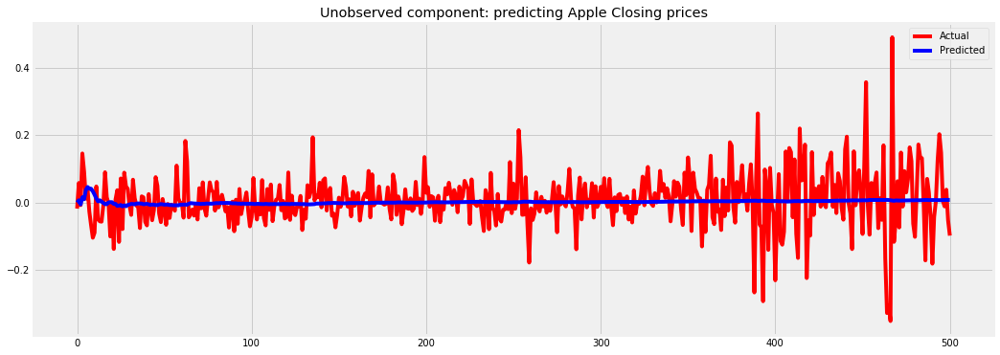

In [130]:
plt.plot(train_sample[1:502],color='red')
plt.plot(predicted_result,color='blue')
plt.legend(['Actual','Predicted'])
plt.title('Unobserved component: predicting Apple Closing prices')
plt.show()

                        Unobserved Components Results                         
Dep. Variable:                      y   No. Observations:                 4514
Model:                    local level   Log Likelihood              -92351.967
Date:                Sat, 09 Dec 2023   AIC                         184707.935
Time:                        00:13:07   BIC                         184720.765
Sample:                             0   HQIC                        184712.455
                               - 4514                                         
Covariance Type:                  opg                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
sigma2.irregular  3.311e+16   2.16e+14    153.312      0.000    3.27e+16    3.35e+16
sigma2.level      7.094e+13   1.71e+13      4.141      0.000    3.74e+13    1.05e+14
Ljung-Box (Q):              

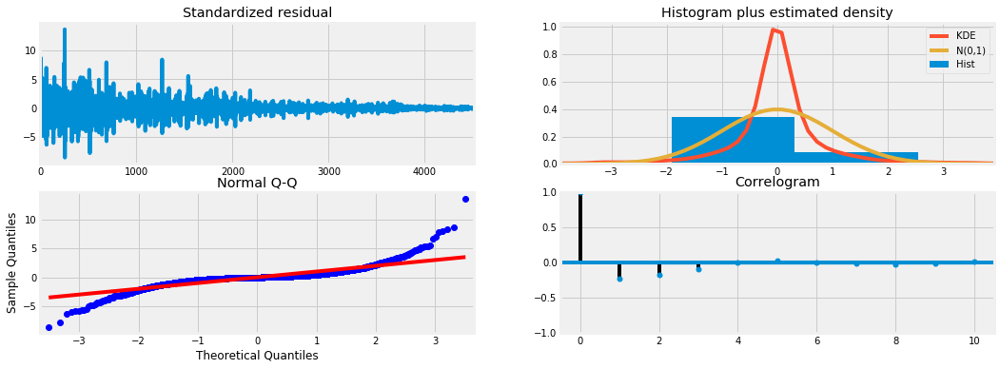

In [131]:
# Predicting Volume of Apple'
train_sample = apple["Volume"].diff().iloc[1:].values
model = sm.tsa.UnobservedComponents(train_sample,'local level')
result = model.fit(maxiter=1000,disp=False)
print(result.summary())
predicted_result = result.predict(start=0, end=500)
result.plot_diagnostics()
# calculating error
rmse = math.sqrt(mean_squared_error(train_sample[1:502], predicted_result))
print("The root mean squared error is {}.".format(rmse))

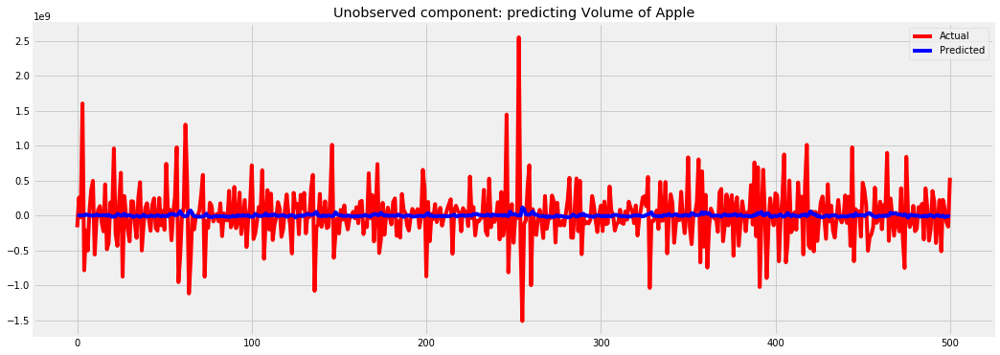

In [132]:
plt.plot(train_sample[1:502],color='red')
plt.plot(predicted_result,color='blue')
plt.legend(['Actual','Predicted'])
plt.title('Unobserved component: predicting Volume of Apple')
plt.show()

## <a id='4.6.3'>4.6.3 Dynamic Factor models</a>
Dynamic-factor models are flexible models for multivariate time series in which the observed endogenous variables are linear functions of exogenous covariates and unobserved factors, which have a vector autoregressive structure. The unobserved factors may also be a function of exogenous covariates. The disturbances in the equations for the dependent variables may be autocorrelated.

                                   Statespace Model Results                                  
Dep. Variable:                    ['Close', 'Close']   No. Observations:                 4515
Model:             DynamicFactor(factors=1, order=2)   Log Likelihood              -12533.346
Date:                               Sat, 09 Dec 2023   AIC                          25078.693
Time:                                       00:13:18   BIC                          25117.184
Sample:                                   01-04-2006   HQIC                         25092.253
                                        - 12-08-2023                                         
Covariance Type:                                 opg                                         
Ljung-Box (Q):              138.52, 178.72   Jarque-Bera (JB):   553563.79, 43545.65
Prob(Q):                        0.00, 0.00   Prob(JB):                    0.00, 0.00
Heteroskedasticity (H):      12.26, 312.57   Skew:                      -1.18,

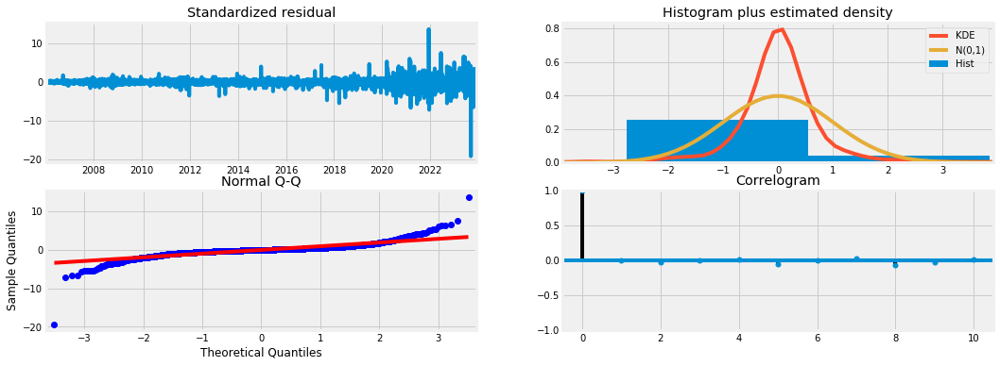

In [133]:
# Predicting closing price of Oracle and Apple
train_sample = pd.concat([oracle["Close"].diff().iloc[1:], apple["Close"].diff().iloc[1:]],axis=1)
train_sample = train_sample.fillna(0.0) # Ideally we should not need to do this
model = sm.tsa.DynamicFactor(train_sample, k_factors=1, factor_order=2)
result = model.fit(maxiter=1000, disp=False)
print(result.summary())
predicted_result = result.predict(start=0, end=1000)
result.plot_diagnostics()
# calculating error
rmse = math.sqrt(mean_squared_error(train_sample.iloc[1:1002].values, predicted_result.values))
print("The root mean squared error is {}.".format(rmse))

In [134]:
predicted_result.columns=['Oracle Prediction', 'Apple Prediction']

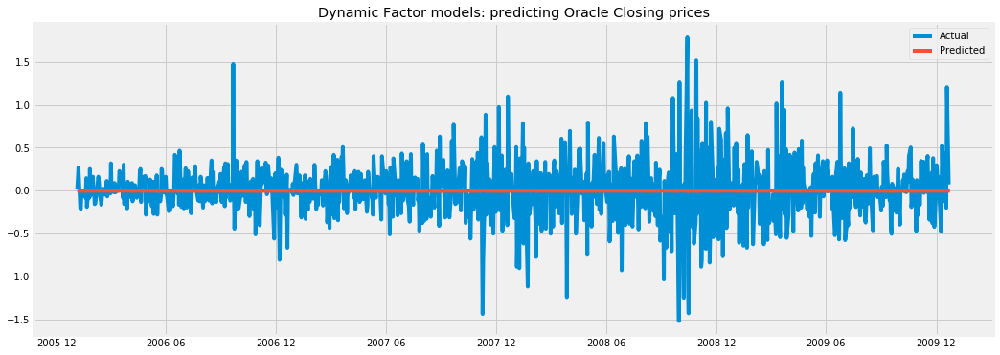

In [135]:
plt.plot(oracle["Close"].diff().iloc[1:1000])
plt.plot(predicted_result['Oracle Prediction'])
plt.legend(['Actual','Predicted'])
plt.title('Dynamic Factor models: predicting Oracle Closing prices')
plt.show()

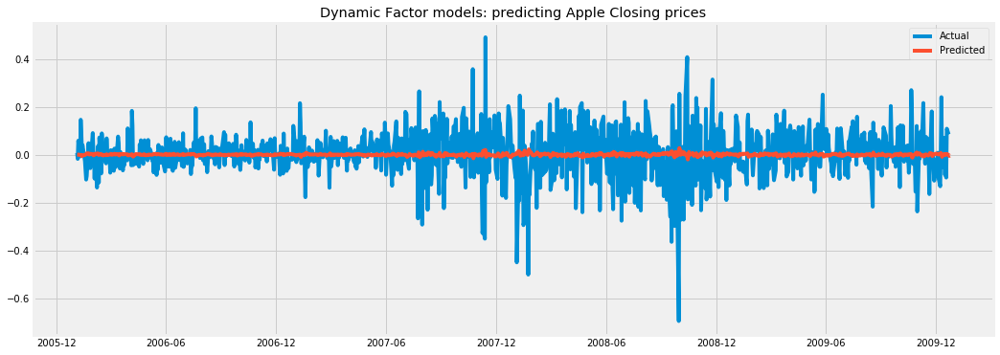

In [136]:
plt.plot(apple["Close"].diff().iloc[1:1000])
plt.plot(predicted_result['Apple Prediction'])
plt.legend(['Actual','Predicted'])
plt.title('Dynamic Factor models: predicting Apple Closing prices')
plt.show()

                                   Statespace Model Results                                  
Dep. Variable:                  ['Volume', 'Volume']   No. Observations:                 4515
Model:             DynamicFactor(factors=1, order=2)   Log Likelihood             -188975.081
Date:                               Sat, 09 Dec 2023   AIC                         377962.162
Time:                                       00:13:24   BIC                         378000.653
Sample:                                   01-04-2006   HQIC                        377975.722
                                        - 12-08-2023                                         
Covariance Type:                                 opg                                         
Ljung-Box (Q):              418.88, 418.75   Jarque-Bera (JB):   90466.75, 90304.65
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.02, 0.02   Skew:                      -1.23, 1

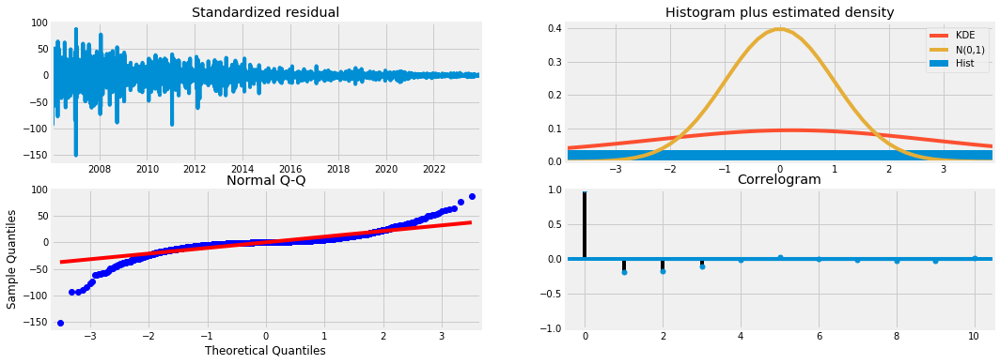

In [137]:
# Predicting Volume of Oracle and Apple
train_sample = pd.concat([oracle["Volume"].diff().iloc[1:], apple["Volume"].diff().iloc[1:]],axis=1)
train_sample = train_sample.fillna(0.0) # Ideally we should not need to do this
model = sm.tsa.DynamicFactor(train_sample, k_factors=1, factor_order=2)
result = model.fit(maxiter=1000, disp=False)
print(result.summary())
predicted_result = result.predict(start=0, end=1000)
result.plot_diagnostics()
# calculating error
rmse = math.sqrt(mean_squared_error(train_sample.iloc[1:1002].values, predicted_result.values))
print("The root mean squared error is {}.".format(rmse))

In [138]:
predicted_result.columns=['Oracle Prediction', 'Apple Prediction']

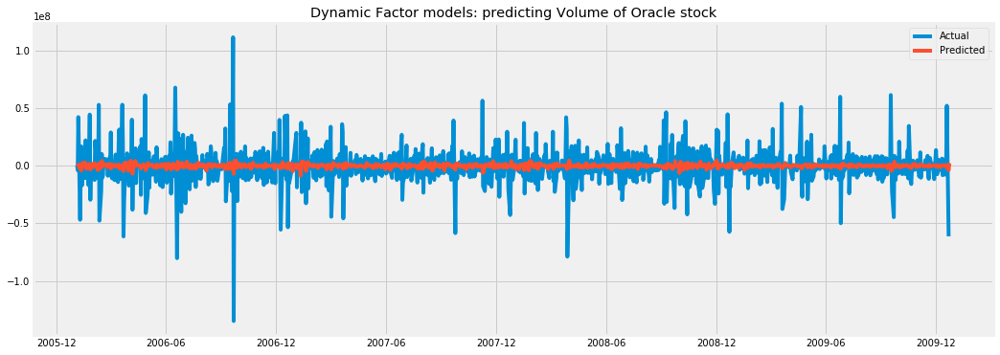

In [139]:
plt.plot(oracle["Volume"].diff().iloc[1:1000])
plt.plot(predicted_result['Oracle Prediction'])
plt.legend(['Actual','Predicted'])
plt.title('Dynamic Factor models: predicting Volume of Oracle stock')
plt.show()

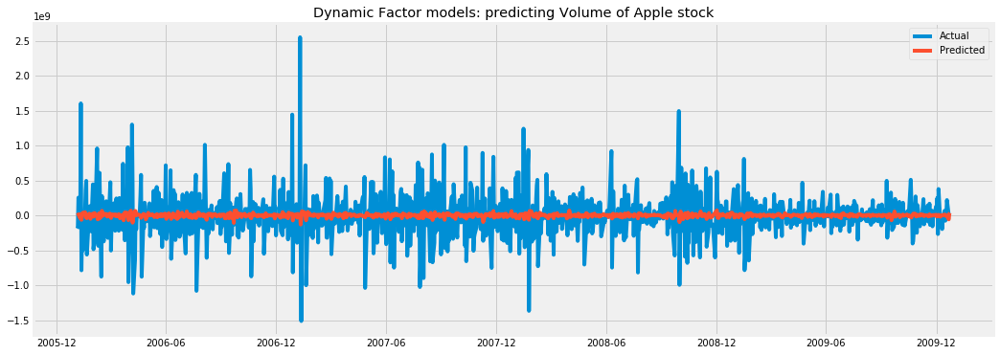

In [140]:
plt.plot(apple["Volume"].diff().iloc[1:1000])
plt.plot(predicted_result['Apple Prediction'])
plt.legend(['Actual','Predicted'])
plt.title('Dynamic Factor models: predicting Volume of Apple stock')
plt.show()